# <font color='#42AAFF'>Содержание</font><a id='toc0_'></a>    
1. [<font color='#42AAFF'>Введение</font>](#toc1_)    
2. [<font color='#42AAFF'>Обзор данных</font>](#toc2_)    
2.1. [<font color='#42AAFF'>Таблица `data_arc`</font>](#toc2_1_)    
2.2. [<font color='#42AAFF'>Таблицы `data_bulk` и `data_bulk_time`</font>](#toc2_2_)    
2.3. [<font color='#42AAFF'>Таблицы `data_wire` и `data_wire_time`</font>](#toc2_3_)    
2.4. [<font color='#42AAFF'>Таблица `data_gas`</font>](#toc2_4_)    
2.5. [<font color='#42AAFF'>Таблица `data_temp`</font>](#toc2_5_)    
2.6. [<font color='#42AAFF'>Вывод</font>](#toc2_6_)    
3. [<font color='#42AAFF'>Физические основы динамики температуры расплава в процессе легирования</font>](#toc3_)    
3.1. [<font color='#42AAFF'>Введение</font>](#toc3_1_)    
3.2. [<font color='#42AAFF'>Уравнение теплового равновесия без учета теплопотерь</font>](#toc3_2_)    
3.3. [<font color='#42AAFF'>Уравнение теплового равновесия с учетом теплопотерь</font>](#toc3_3_)    
3.4. [<font color='#42AAFF'>Вывод</font>](#toc3_4_)    
4. [<font color='#42AAFF'>Предобработка и исследовательский анализ данных</font>](#toc4_)    
4.1. [<font color='#42AAFF'>Приведение названий столбцов в соответствие PEP8</font>](#toc4_1_)    
4.2. [<font color='#42AAFF'>Коррекция типов данных</font>](#toc4_2_)    
4.3. [<font color='#42AAFF'>Экспериментальное исследование техпроцесса легирования стали</font>](#toc4_3_)    
4.4. [<font color='#42AAFF'>Анализ измерений температуры</font>](#toc4_4_)    
4.5. [<font color='#42AAFF'>Анализ параметров циклов нагрева</font>](#toc4_5_)    
4.6. [<font color='#42AAFF'>Анализ объема газа</font>](#toc4_6_)    
4.7. [<font color='#42AAFF'>Массы легирующих компонент</font>](#toc4_7_)    
4.8. [<font color='#42AAFF'>Вывод</font>](#toc4_8_)    
5. [<font color='#42AAFF'>Подготовка признаков для обучения моделей</font>](#toc5_)    
5.1. [<font color='#42AAFF'>Формирование таблиц признаков</font>](#toc5_1_)    
5.2. [<font color='#42AAFF'>Подготовка выборок</font>](#toc5_2_)    
5.3. [<font color='#42AAFF'>Стандартизация признаков</font>](#toc5_3_)    
5.4. [<font color='#42AAFF'>Исключение мультиколлинеарных признаков</font>](#toc5_4_)    
5.5. [<font color='#42AAFF'>Вывод</font>](#toc5_5_)    
6. [<font color='#42AAFF'>Обучение моделей</font>](#toc6_)    
6.1. [<font color='#42AAFF'>Линейная регрессия</font>](#toc6_1_)    
6.2. [<font color='#42AAFF'>XGBoost</font>](#toc6_2_)    
6.3. [<font color='#42AAFF'>LightGBM</font>](#toc6_3_)    
6.4. [<font color='#42AAFF'>CatBoost</font>](#toc6_4_)    
6.5. [<font color='#42AAFF'>Вывод</font>](#toc6_5_)    
7. [<font color='#42AAFF'>Проверка моделей на тестовой выборке</font>](#toc7_)    
7.1. [<font color='#42AAFF'>Линейная регрессия</font>](#toc7_1_)    
7.2. [<font color='#42AAFF'>XGBoost</font>](#toc7_2_)    
7.3. [<font color='#42AAFF'>LightGBM</font>](#toc7_3_)    
7.4. [<font color='#42AAFF'>CatBoost</font>](#toc7_4_)    
7.5. [<font color='#42AAFF'>Вывод</font>](#toc7_5_)    
8. [<font color='#42AAFF'>Общий вывод</font>](#toc8_)    

<!-- vscode-jupyter-toc-config
	numbering=true
	anchor=true
	flat=true
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# 1. <a id='toc1_'></a>[<font color='#42AAFF'>Введение</font>](#toc0_)

<b>Основная цель:</b>

Для оптимизации расходов металлургического комбината необходимо снизить энергопотребление этапа обработки стали. Для такого снижения есть технологические предпоссылки. Для обеспечения производства стали с нужными характеристиками в исходную расплавленную руду, состав которой может зависеть от партии, в несколько итераций добавляются легирующие добавки, удаляются вредные примеси, проводится химический анализ состава, между итерациями расплав дополнительно подогревается, и не редко подогрев оказывается избыточным. Таким образом, энергопотребление можно снизить за счёт модели, способной прогнозировать финальную температуру расплава.

<b>Описание этапа обработки</b>

Сталь обрабатывают в металлическом ковше вместимостью около 100 тонн. Чтобы ковш выдерживал высокие температуры, изнутри его облицовывают огнеупорным кирпичом. Расплавленную сталь заливают в ковш и подогревают до нужной температуры графитовыми электродами. Они установлены в крышке ковша. 

Из сплава выводится сера (десульфурация), добавлением примесей корректируется химический состав и отбираются пробы. Сталь легируют — изменяют её состав — подавая куски сплава из бункера для сыпучих материалов или проволоку через специальный трайб-аппарат (англ. tribe, «масса»).

Перед тем как первый раз ввести легирующие добавки, измеряют температуру стали и производят её химический анализ. Потом температуру на несколько минут повышают, добавляют легирующие материалы и продувают сплав инертным газом. Затем его перемешивают и снова проводят измерения. Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

Тогда расплавленная сталь отправляется на доводку металла или поступает в машину непрерывной разливки. Оттуда готовый продукт выходит в виде заготовок-слябов (англ. *slab*, «плита»).

<b>Описание данных</b>
Данные состоят из файлов, полученных из разных источников:

- `data_arc.csv` — данные об электродах;
- `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
- `data_bulk_time.csv` *—* данные о подаче сыпучих материалов (время);
- `data_gas.csv` — данные о продувке сплава газом;
- `data_temp.csv` — результаты измерения температуры;
- `data_wire.csv` — данные о проволочных материалах (объём);
- `data_wire_time.csv` — данные о проволочных материалах (время).

Во всех файлах столбец `key` содержит номер партии. В файлах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.



# 2. <a id='toc2_'></a>[<font color='#42AAFF'>Обзор данных</font>](#toc0_)

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
import seaborn as sns
import numpy as np
import xgboost as xgb
import lightgbm as lgb
import catboost as cat
from scipy import stats as st
from joblib import dump, load
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold, GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_absolute_error, make_scorer, r2_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import IsolationForest 

c:\ProgramData\Anaconda3\envs\ml\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
data_arc = pd.read_csv('final_steel/data_arc.csv')
data_bulk = pd.read_csv('final_steel/data_bulk.csv')
data_bulk_time = pd.read_csv('final_steel/data_bulk_time.csv')
data_gas = pd.read_csv('final_steel/data_gas.csv')
data_temp = pd.read_csv('final_steel/data_temp.csv')
data_wire = pd.read_csv('final_steel/data_wire.csv') 
data_wire_time = pd.read_csv('final_steel/data_wire_time.csv')

In [3]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', -1)

## 2.1. <a id='toc2_1_'></a>[<font color='#42AAFF'>Таблица `data_arc`</font>](#toc0_)

In [4]:
data_arc.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 2.5 MB


In [5]:
data_arc.head(10)

,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397
5,2,2019-05-03 11:34:14,2019-05-03 11:36:31,0.438063,0.283043
6,2,2019-05-03 11:38:50,2019-05-03 11:44:28,1.296415,0.892914
7,2,2019-05-03 11:46:19,2019-05-03 11:48:25,0.490377,0.305281
8,2,2019-05-03 11:49:48,2019-05-03 11:53:18,0.827743,0.516874
9,3,2019-05-03 12:06:54,2019-05-03 12:11:34,1.062053,0.671494


In [6]:
print(f'Кол-во уникальных партий data_arc: {data_arc["key"].nunique()}')

Кол-во уникальных партий data_arc: 3214


In [7]:
print(f'Кол-во явных дубликатов: {data_arc.duplicated().sum()}')

Кол-во явных дубликатов: 0


Таким образом можно сделать следующие выводы:
1. Таблица содержит 4 столбца (не считая столбца `key`): дата начала нагрева дугой, дата конца нагрева дугой, активная и реактивная мощности. Одной партии металла соответствует несколько этапов нагрева дугой.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных нуждаются в корректировке.
4. Нет пропусков.
5. Нет дубликатов.
6. Можно определить ряд статистических параметров нагрева для каждой из партий, таких как кол-во этапов нагрева, общая продолжительность нагрева, энергопотребление.

## 2.2. <a id='toc2_2_'></a>[<font color='#42AAFF'>Таблицы `data_bulk` и `data_bulk_time`</font>](#toc0_)

In [8]:
data_bulk.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     float64
 6   Bulk 6   576 non-null    float64
 7   Bulk 7   25 non-null     float64
 8   Bulk 8   1 non-null      float64
 9   Bulk 9   19 non-null     float64
 10  Bulk 10  176 non-null    float64
 11  Bulk 11  177 non-null    float64
 12  Bulk 12  2450 non-null   float64
 13  Bulk 13  18 non-null     float64
 14  Bulk 14  2806 non-null   float64
 15  Bulk 15  2248 non-null   float64
dtypes: float64(15), int64(1)
memory usage: 391.2 KB


In [9]:
data_bulk.head(5)

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,150.0,154.0
1,2,NaN,NaN,NaN,73.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,206.0,NaN,149.0,154.0
2,3,NaN,NaN,NaN,34.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,205.0,NaN,152.0,153.0
3,4,NaN,NaN,NaN,81.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,207.0,NaN,153.0,154.0
4,5,NaN,NaN,NaN,78.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,203.0,NaN,151.0,152.0


In [10]:
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


In [11]:
data_bulk_time.head()

,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,2019-05-03 11:21:30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:03:52,NaN,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaN,NaN,NaN,2019-05-03 11:46:38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 11:40:20,NaN,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaN,NaN,NaN,2019-05-03 12:31:06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:09:40,NaN,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaN,NaN,NaN,2019-05-03 12:48:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 12:41:24,NaN,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaN,NaN,NaN,2019-05-03 13:18:50,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-03 13:12:56,NaN,2019-05-03 13:12:56,2019-05-03 13:12:56


In [12]:
print(f'Кол-во уникальных партий data_bulk: {data_bulk["key"].nunique()}')
print(f'Кол-во уникальных партий data_bulk_time: {data_bulk_time["key"].nunique()}')
print(f'Кол-во явных дубликатов data_bulk: {data_bulk.duplicated().sum()}')
print(f'Кол-во явных дубликатов data_bulk_time: {data_bulk_time.duplicated().sum()}')

Кол-во уникальных партий data_bulk: 3129
Кол-во уникальных партий data_bulk_time: 3129
Кол-во явных дубликатов data_bulk: 0
Кол-во явных дубликатов data_bulk_time: 0


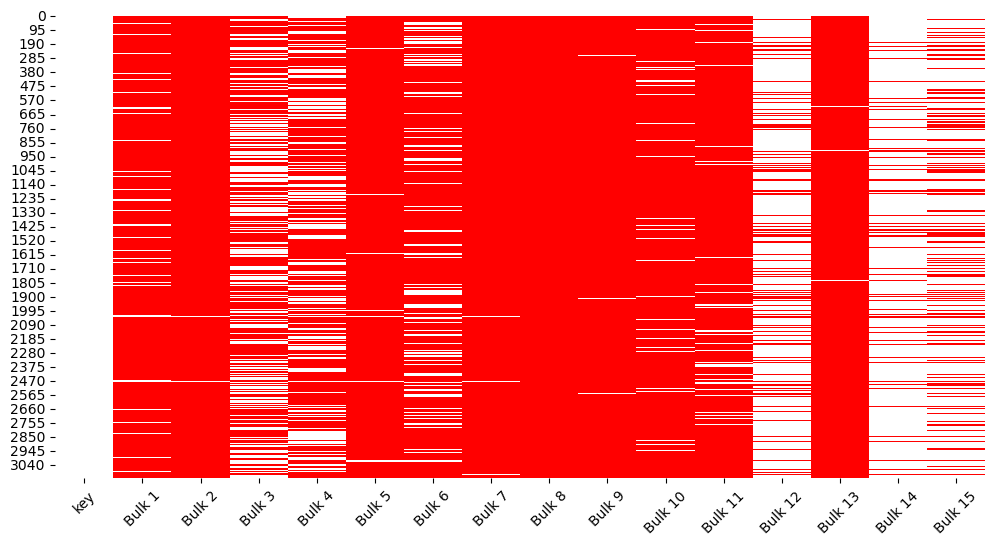

In [13]:
colours = ['#FFFFFF','#ff0000']
cmap=sns.color_palette(colours)
fig, axs = plt.subplots(figsize=(12,6))
cols = data_bulk.columns    
sns.heatmap(data=data_bulk[cols].isna(),cmap=cmap ,ax=axs, cbar=False)  
axs.tick_params(axis='x', labelrotation=45)
plt.show()

In [14]:
data_bulk.isna().agg(['sum','mean']).T.style.format({"sum": "{:.0f}", "mean": "{:.1%}"})

,sum,mean
key,0,0.0%
Bulk 1,2877,91.9%
Bulk 2,3107,99.3%
Bulk 3,1831,58.5%
Bulk 4,2115,67.6%
Bulk 5,3052,97.5%
Bulk 6,2553,81.6%
Bulk 7,3104,99.2%
Bulk 8,3128,100.0%
Bulk 9,3110,99.4%


Из информации по таблицам видно, что количество непустых строк в соответствующих столбцах идентичны. Таким образом можно предположить, что каждой непустой клетке объема сыпучего материала соответствует дата его добавления. Убедимся в этом.

In [15]:
(data_bulk.isna()==data_bulk_time.isna()).sum()

key        3129
Bulk 1     3129
Bulk 2     3129
Bulk 3     3129
Bulk 4     3129
Bulk 5     3129
Bulk 6     3129
Bulk 7     3129
Bulk 8     3129
Bulk 9     3129
Bulk 10    3129
Bulk 11    3129
Bulk 12    3129
Bulk 13    3129
Bulk 14    3129
Bulk 15    3129
dtype: int64

Таким образом можно сделать следующие выводы:
1. В таблицах представлены 15 столбцов (не считая столбца `key`), которые соответствуют легирующим добавкам в форме сыпучего материала.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных в data_bulk, в data_bulk_time нуждаются в коррекции.
4. Позиции пропусков совпадают в обеих таблицах. Доля пропусков в большинстве колонок очень большая:    
    - `Bulk 12`, `Bulk 14`, `Bulk 15` содержат относительно небольшое количество пропусков (до 30%)
    - `Bulk 4`, `Bulk 6` содержат большое количество пропусков (60-85%)
    - в остальных колонках доля пропусков превышает 90%, а `Bulk 8` содержит 100% пропусков и не несёт полезной информации
5. Нет дубликатов.

## 2.3. <a id='toc2_3_'></a>[<font color='#42AAFF'>Таблицы `data_wire` и `data_wire_time`</font>](#toc0_)

In [16]:
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   float64
 3   Wire 3  63 non-null     float64
 4   Wire 4  14 non-null     float64
 5   Wire 5  1 non-null      float64
 6   Wire 6  73 non-null     float64
 7   Wire 7  11 non-null     float64
 8   Wire 8  19 non-null     float64
 9   Wire 9  29 non-null     float64
dtypes: float64(9), int64(1)
memory usage: 240.8 KB


In [17]:
data_wire.sample(5)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
11,12,153.578873,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
682,725,117.093597,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
567,602,67.111198,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2315,2439,136.631039,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1345,1416,70.012794,72.112556,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [18]:
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


In [19]:
data_wire_time.sample(5)

,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
1257,1326,2019-06-20 00:06:23,2019-06-20 00:06:43,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3031,3190,2019-08-30 12:55:29,2019-08-30 13:09:49,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2832,2985,2019-08-23 19:33:21,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3038,3197,2019-08-30 18:50:07,2019-08-30 18:52:12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1858,1949,2019-07-17 12:10:59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:
print(f'Кол-во уникальных партий data_wire: {data_wire["key"].nunique()}')
print(f'Кол-во уникальных партий data_wire_time: {data_wire_time["key"].nunique()}')
print(f'Кол-во явных дубликатов data_wire: {data_wire.duplicated().sum()}')
print(f'Кол-во явных дубликатов data_wire_time: {data_wire_time.duplicated().sum()}')

Кол-во уникальных партий data_wire: 3081
Кол-во уникальных партий data_wire_time: 3081
Кол-во явных дубликатов data_wire: 0
Кол-во явных дубликатов data_wire_time: 0


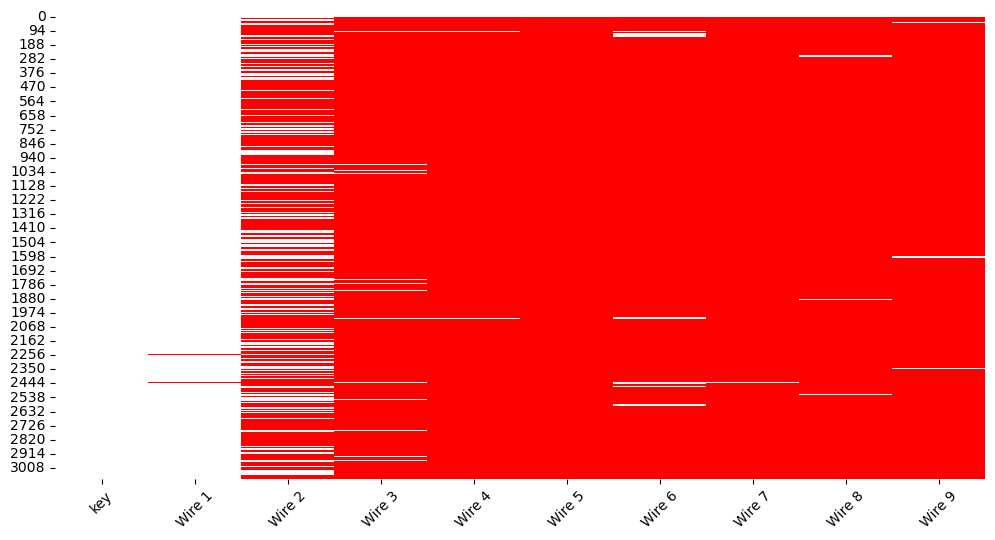

In [21]:
colours = ['#FFFFFF','#ff0000']
cmap=sns.color_palette(colours)
fig, axs = plt.subplots(figsize=(12,6))
cols = data_wire.columns    
sns.heatmap(data=data_wire[cols].isna(),cmap=cmap ,ax=axs, cbar=False)  
axs.tick_params(axis='x', labelrotation=45)
plt.show()

In [22]:
data_wire.isna().agg(['sum','mean']).T.style.format({"sum": "{:.0f}", "mean": "{:.1%}"})

,sum,mean
key,0,0.0%
Wire 1,26,0.8%
Wire 2,2002,65.0%
Wire 3,3018,98.0%
Wire 4,3067,99.5%
Wire 5,3080,100.0%
Wire 6,3008,97.6%
Wire 7,3070,99.6%
Wire 8,3062,99.4%
Wire 9,3052,99.1%


Из информации по таблицам видно, что количество непустых строк в соответствующих столбцах идентичны. Таким образом можно предположить, что каждой непустой клетке объема сыпучего материала соответствует дата его добавления. Убедимся в этом.

In [23]:
(data_wire.isna()==data_wire_time.isna()).sum()

key       3081
Wire 1    3081
Wire 2    3081
Wire 3    3081
Wire 4    3081
Wire 5    3081
Wire 6    3081
Wire 7    3081
Wire 8    3081
Wire 9    3081
dtype: int64

Таким образом можно сделать следующие выводы:
1. В таблицах представлены 9 столбцов (не считая столбца `key`), которые соответствуют легирующим добавкам в форме проволоки.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных соответствуют в data_wire, в data_wire_time нуждаются в коррекции.
4. Позиции пропусков совпадают в обеих таблицах. Доля пропусков в большинстве колонок очень большая:    
    - `Wire 1` содержит мало пропусков (<1%)
    - `Wire 2` содержит 65% пропусков
    - в остальных колонках доля пропусков превышает 97%, а `Wire 5` содержит 100% пропусков и не несёт полезной информации
5. Нет дубликатов.

## 2.4. <a id='toc2_4_'></a>[<font color='#42AAFF'>Таблица `data_gas`</font>](#toc0_)

In [24]:
data_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


In [25]:
data_gas.head()

,key,Газ 1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


In [26]:
print(f'Кол-во уникальных партий data_gas: {data_gas["key"].nunique()}')

Кол-во уникальных партий data_gas: 3239


In [27]:
data_gas.isna().agg(['sum','mean']).T.style.format({"sum": "{:.0f}", "mean": "{:.1%}"})

,sum,mean
key,0,0.0%
Газ 1,0,0.0%


In [28]:
print(f'Кол-во явных дубликатов: {data_gas.duplicated().sum()}')

Кол-во явных дубликатов: 0


Таким образом можно сделать следующие выводы:
1. В таблице 1 столбец (не считая столбца `key`), соответствующий объему защитного инертного газа.
2. Название столбца не соответствует PEP8.
3. Тип данных не нуждается в коррекции.
4. Нет пропусков.
5. Нет дубликатов.

## 2.5. <a id='toc2_5_'></a>[<font color='#42AAFF'>Таблица `data_temp`</font>](#toc0_)

In [29]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   key           15907 non-null  int64  
 1   Время замера  15907 non-null  object 
 2   Температура   13006 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 372.9+ KB


In [30]:
data_temp.head()

,key,Время замера,Температура
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0


In [31]:
print(f'Кол-во уникальных партий data_temp: {data_temp["key"].nunique()}')

Кол-во уникальных партий data_temp: 3216


In [32]:
data_temp.isna().agg(['sum','mean']).T.style.format({"sum": "{:.0f}", "mean": "{:.1%}"})

,sum,mean
key,0,0.0%
Время замера,0,0.0%
Температура,2901,18.2%


In [33]:
print(f'Кол-во явных дубликатов: {data_temp.duplicated().sum()}')

Кол-во явных дубликатов: 0


Таким образом можно сделать следующие выводы:
1. В таблице 2 столбцa (не считая столбца `key`) время замера и температура.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных нуждаются в коррекции.
4. Доля пропусков температуры составляет ~18%. Необходимость и возможность их заполнения нуждается в дополнительном исследовании.
5. Нет дубликатов.

## 2.6. <a id='toc2_6_'></a>[<font color='#42AAFF'>Вывод</font>](#toc0_)

I. Таблицы `data_bulk` и `data_bulk_time`:
1. В таблицах представлены 15 столбцов (не считая столбца `key`), которые соответствуют легирующим добавкам в форме сыпучего материала. Таблицы содержат 3129 строк, каждая из которых имеет уникальный номер партии, таким образом один тип легирующего компонента добавляется лишь 1 раз.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных в data_bulk, в data_bulk_time нуждаются в коррекции.
4. Позиции пропусков совпадают в обеих таблицах. Доля пропусков в большинстве колонок очень большая:    
    - `Bulk 12`, `Bulk 14`, `Bulk 15` содержат относительно небольшое количество пропусков (до 30%)
    - `Bulk 4`, `Bulk 6` содержат большое количество пропусков (60-85%)
    - в остальных колонках доля пропусков превышает 90%, а `Bulk 8` содержит 100% пропусков и не несёт полезной информации
5. Нет дубликатов.

II. Таблицы `data_wire` и `data_wire_time`:
1. В таблицах представлены 9 столбцов (не считая столбца `key`), которые соответствуют легирующим добавкам в форме проволоки. Таблицы содержат 3081 строку, каждая из которых имеет уникальный номер партии, таким образом один тип легирующего компонента добавляется лишь 1 раз.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных соответствуют в data_wire, в data_wire_time нуждаются в коррекции.
4. Позиции пропусков совпадают в обеих таблицах. Доля пропусков в большинстве колонок очень большая:    
    - `Wire 1` содержит мало пропусков (<1%)
    - `Wire 2` содержит 65% пропусков
    - в остальных колонках доля пропусков превышает 97%, а `Wire 5` содержит 100% пропусков и не несёт полезной информации
5. Нет дубликатов.

III. Таблица `data_arc`:
1. Таблица содержит 4 столбца (не считая столбца `key`): дата начала нагрева дугой, дата конца нагрева дугой, активная и реактивная мощности. Таблица сождержит 14876 строк с 3214 уникальными номерами партий. Таким образом, 
одной партии металла соответствует несколько этапов нагрева дугой.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных нуждаются в корректировке.
4. Нет пропусков.
5. Нет дубликатов.
6. Можно определить ряд статистических параметров нагрева для каждой из партий, таких как кол-во этапов нагрева, общая продолжительность нагрева, энергопотребление.

IV. Таблица `data_gas`:
1. В таблице 1 столбец (не считая столбца `key`), соответствующий объему защитного инертного газа. Таблица содержат 3239 строк, все с уникальным номером партии.
2. Название столбца не соответствует PEP8.
3. Тип данных не нуждается в коррекции.
4. Нет пропусков.
5. Нет дубликатов.

V. Таблица `data_temp`:
1. В таблице 2 столбцa (не считая столбца `key`) время замера и температура. Таблица содержит 15907 строк, в которых используется 3216 уникальных номеров партий.
2. Названия столбцов не соответствуют PEP8.
3. Типы данных нуждаются в коррекции.
4. Доля пропусков температуры составляет ~18%. Необходимость и возможность их заполнения нуждается в дополнительном исследовании.
5. Нет дубликатов.

# 3. <a id='toc3_'></a>[<font color='#42AAFF'>Физические основы динамики температуры расплава в процессе легирования</font>](#toc0_)

## 3.1. <a id='toc3_1_'></a>[<font color='#42AAFF'>Введение</font>](#toc0_)

Тепловые процессы в ковше хорошо описываются пространственно-временным дифференциальным уравнением теплопередачи. Если считать, что:
1. Расплав в моменты измерений температуры находится в пространственно однородном жидком состоянии. 
2. Расплав имеет установившуюся по всему объему температуру (а в противном случае измерения не годятся для того чтобы характеризовать весь расплав).
3. Коэффициенты уравнения теплопроводности (теплопроводность, теплоемкость, коэффициенты излучения и конвекции) можно приближенно считать постоянными. Строго говоря, это утверждение неверно на перепаде температуры от комнатной до температуры плавления, но тем не менее такое приближение может иметь практический смысл.

то можем вместо дифференциального уравнения теплопроводности перейти к его линеаризованному по времени (и независящему от простанственной координаты) варианту - уравнению теплового баланса, например, для моментов первого и последнего измерений температуры:

$Q_{ind}$ = $Q_{heat-base} + Q_{heat-add} + Q_{melt-add} - Q_{loss}$,

где
- $Q_{ind}$ - энергия нагрева индукционной печью, численно равная сумме по всем итерациям нагрева произведения активной мощности $P_i$ на время работы печи $\Delta t_i$  в итерации $i$;
- $Q_{heat-base}$ - энергия на нагрев основы относительно температуры 1го измерения;
- $Q_{heat-add}$ - энергия на нагрев легирующих компонент;
- $Q_{melt-add}$ - теплота плавления легирующих компонент;
- $Q_{loss}$ - потери энергии на конвекцию, излучение и теплопередачу

## 3.2. <a id='toc3_2_'></a>[<font color='#42AAFF'>Уравнение теплового равновесия без учета теплопотерь</font>](#toc0_)

$Q_{ind}$ = $Q_{heat-base} + Q_{heat-add} + Q_{melt-add}$

Распишем каждую из компонент подробно:

$Q_{ind}$ = $\sum\limits _{i} ^{}P_i \Delta t_i$, 

где 
- $P_i$ - активная мощность на i интервале нагрева;
- $\Delta t_i$ - время работы печи на i интервале нагрева

$Q_{heat-base} = c_0m_0(T-T_1)$, 

где
- $c_0$ - теплоемкость основы; 
- $m_0$ - масса основы; 
- $T$ - финальная температура; 
- $T_1$ - температура 1го измерения

Очевидно, что теплоемкость легирующих компонент существенно зависит от температуры и может отличаться в разы, кроме того теплоемкость меняется и при фазовом переходе, но для простоты мы будем использовать некоторую усредненную теплоемкость для каждой компоненты:

$Q_{heat-add}$ = $Q_{heat-bulk} + Q_{heat-wire}$ = $\sum\limits _{b} ^{}c_b m_b (T-T_0) + \sum\limits _{w} ^{}c_w m_w (T-T_0)$,

где
- $c_b$ - теплоемкость b-го легирующего сыпучего компонента;
- $m_b$ - масса b-го легирующего сыпучего компонента;
- $c_w$ - теплоемкость w-го легирующего проволочного компонента;
- $m_w$ - масса w-го легирующего проволочного компонента;
- $T$ - финальная температура;
- $T_0$ - начальная температура легирующих компонет, вероятно комнатная

Теплота плавления является произведением удельной теплоты плавления на массу легирующего компонента. Отметим, что и масса и удельная теплота плавления для каждой из присадок разные.

$Q_{melt-add}$ = $Q_{melt-bulk} + Q_{melt-wire}$ = $\sum\limits _{b} ^{}\lambda_b m_b + \sum\limits _{w} ^{}\lambda_w m_w$,

где
- $\lambda_b$ - удельная теплота плавления b-го легирующего сыпучего компонента;
- $\lambda_w$ - удельная теплота плавления w-го легирующего проволочного компонента;

Подставим все выкладки в исходное уравнение:

$\sum\limits _{i} ^{}P_i \Delta t_i$ = $c_0m_0(T-T_1) + \sum\limits _{b} ^{}c_b m_b (T-T_0) + \sum\limits _{w} ^{}c_w m_w (T-T_0) + \sum\limits _{b} ^{}\lambda_b m_b + \sum\limits _{w} ^{}\lambda_w m_w$

Преобразуем уравнение перенеся слагаемые с финальной температурой $T$ в одну сторону, а остальные в другую:

$ T(c_0m_0 + \sum\limits _{b} ^{}c_b m_b + \sum\limits _{w} ^{}c_w m_w)$ = $\sum\limits _{i} ^{}P_i \Delta t_i + \sum\limits _{b} ^{}(c_b T_0 - \lambda_b)m_b + \sum\limits _{w} ^{}(c_w T_0 - \lambda_w)m_w + c_0m_0T_1$ 

Выразим T:

$T$ = $\frac{1}{c_0m_0} \frac{\sum\limits _{i} ^{}P_i \Delta t_i + \sum\limits _{b} ^{}(c_b T_0 - \lambda_b)m_b + \sum\limits _{w} ^{}(c_w T_0 - \lambda_w)m_w + c_0m_0T_1}{1 + \frac{\sum\limits _{b} ^{}c_b m_b + \sum\limits _{w} ^{}c_w m_w}{c_0m_0}}$ 

Если теплоемкость легирующих компонент значительно меньше теплоемкости основы:

$\frac{\sum\limits _{b} ^{}c_b m_b + \sum\limits _{w} ^{}c_w m_w}{c_0m_0} \ll 1$

то выражение для температуры можно разложить в ряд Фурье, оставив 2 первых члена ряда:

$T \approx \frac{1}{c_0m_0} (1 - \frac{\sum\limits _{b} ^{}c_b m_b + \sum\limits _{w} ^{}c_w m_w}{c_0m_0})(\sum\limits _{i} ^{}P_i \Delta t_i + \sum\limits _{b} ^{}(c_b T_0 - \lambda_b)m_b + \sum\limits _{w} ^{}(c_w T_0 - \lambda_w)m_w + c_0m_0T_1)$ 

Из полученной формулы следует, что финальную температуру T можно представить в виде линейной комбинации известных признаков и для решения задачи вполне применима линейная регрессия. Если оставить лишь 1 член разложения в ряд Маклорена, то формула примет наиболее простой вид, в котором признаки выделим жирным:


$T \approx a_0\mathbf{T_1}+a_1	\mathbf{\sum\limits _{i} ^{}P_i \Delta t_i} + \sum\limits _{b} ^{}\hat{c}_b	\mathbf{m_b} + \sum\limits _{w} ^{}\hat{c}_w\mathbf{m_w}$ 

Если же теплоемкость легирующих компонент сравнима с теплоемкостью основы, то очевидно, что зависимость будет нелинейной, и в этом случае более эффективной моделью может оказаться бустинг.

## 3.3. <a id='toc3_3_'></a>[<font color='#42AAFF'>Уравнение теплового равновесия с учетом теплопотерь</font>](#toc0_)

Очевидно, что тепло ковша также рассеивается в окружающее пространство. Теоретически возможны следующие механизма теплопотерь $Q_{loss}$ от ковша: за счет теплопроводности от тела ковша к твердому окружению, свободной конвекции воздуха вокруг ковша, вынужденной конвекции при обдуве газом и излучения с поверхности ковша:

$Q_{loss}$ = $Q_{cond} + Q_{free-conv} + Q_{ind-conv} + Q_{rad}$,

где
- $Q_{cond}$ потери тепла за счет теплопроводности;
- $Q_{free-conv}$ потери тепла за счет свободной конвекции воздуха;
- $Q_{ind-conv}$ потери тепла за счет вынужденной конвекции при обдуве газом;
- $Q_{rad}$ потери тепла за счет излучения


Для простоты процесса будем считать все процесса стационарными (что безусловно является приближением). Рассмотрим каждую из компонент подробно:

$Q_{cond} = k S_k (\bar{T}-T_0) \Delta t$,

где
- $k$ - коэффициент теплопроводности;
- $S_k$ - площадь контакта теплопередачи;
- $\Delta t$ - время между первым и последним измерением температуры;
- $\bar{T}$ - средняя температура расплава на интервале между первым и последним измерениями

$Q_{free-conv} = \alpha S_{\alpha} (\bar{T}-T_0) \Delta t$,

где
- $\alpha$ - средний коэффициент конвекции;
- $\Delta t$ - время между первым и последним измерением температуры;
- $S_{\alpha}$ - площадь, с которой осуществляется конвекция

С вынужденной конвекцией все несколько сложнее, так как известно, что обдув происходит в течение некоторого неизвестного периода времени после нагрева, но при этом нет информации о том как это процесс проходит:
1. Одинаковы ли параметры обдува после каждого из циклов нагрева?
2. Постоянна ли скорость обдува?
3. Постоянно ли время обдува?

Понятно, что простор для вариантов огромный, поэтому рассмотрим 2 крайних случая:
1. Скорость обдува постоянна и V газа влияет только на продолжительность обдува.
2. Время обдува постоянно, и V газа влияет только на скорость обдува.

Аналитически такую комбинацию можно представить в виде:

$Q_{ind-conv} = \delta_1 S V(\bar{T}-T_0) \Delta t_{conv} + \delta_2 S V^{0.5}(\bar{T}-T_0) \Delta t_{conv} $ ,

где
- $\delta_1, \delta_2$ - постоянные;
- $\Delta t_{conv}$ - характерное время обдува;
- $S$ - площадь, с которой осуществляется конвекция;
- $V$ - объем газа;
- $\bar{T}$ - средняя температура расплава;
- $T_0$ - комнатная температура


$Q_{rad} = \gamma \sigma S \bar{T}^4 \Delta t$,

где
- $\gamma$ - коэффициент серости;
- $\sigma$ - постоянная Больцмана;
- $S$ - площадь ковша



Среднюю температуру $\bar{T}$ будем определять определять как средневзвешенную по всем измерениям с учетом интервалов между измерениями:

$\bar{T}$ = $\frac{\sum\limits _{j=1} ^{n-1}T_j\Delta t_j} {\sum\limits _{j=1} ^{n-1}\Delta t_j} $,

где
- $T_j$ - j значение измерений температуры;
- $T_1$ - первое значение температуры;
- $T_{n-1}$ - предпоследнее значение температуры;
- $\Delta t_j$ - интервал времени между j и j+1 измерением 


Тогда уравнение для финальной температуры примет вид:


$T \approx a_0\mathbf{T_1}+a_1	\mathbf{\sum\limits _{i} ^{}P_i \Delta t_i} + \sum\limits _{b} ^{}\hat{c}_b	\mathbf{m_b} + \sum\limits _{w} ^{}\hat{c}_w\mathbf{m_w} + a_2\mathbf{\Delta t} + a_3\mathbf{\bar{T}\Delta t} + a_4\mathbf{\bar{T}^4\Delta t} + a_5 \mathbf{V} + a_6 \mathbf{V^{0.5}} + a_7 \mathbf{V\bar{T}} + a_8 \mathbf{V^{0.5}\bar{T}}$ 

## 3.4. <a id='toc3_4_'></a>[<font color='#42AAFF'>Вывод</font>](#toc0_)

I. На основании понимания физики процесса финальная температура $T$ расплава при определенных приближениях может быть представлена в виде линейной комбинации следующих факторов (следовательно применима модель линейной регрессии):
1. $\mathbf{T_1}$ - температура 1го измерения
2. $\mathbf{\sum\limits _{i} ^{}P_i \Delta t_i}$ - суммарная энергия нагрева электродами в интервале температур между $T_1$ и $T$
3. $\mathbf{m_b}$ - массы сыпучих легирующих компонент
4. $\mathbf{m_w}$ - массы проволочных легирующих компонент
5. $\mathbf{\Delta t}$ - интервал времени между первым и последним измерениями температур
6. $\mathbf{\bar{T}\Delta t}$ - произведение средневзвешенной температуры расплава и интервала времени между крайними измерениями
7. $\mathbf{\bar{T}^4\Delta t}$ - произведение средневзвешенной температуры расплава в 4 степени и интервала времени между крайними измерениями
8. $\mathbf{V}$ - объем газа
9. $\mathbf{V^{0.5}}$ - корень кв. из объема газа
10. $\mathbf{V\bar{T}}$ - произведение объема газа на средневзвешенную температуру
11. $\mathbf{V^{0.5}\bar{T}}$ - произведение корня кв. из объема газа на средневзвешенную температуру

II. Более точное представление финальной температуры $T$ нелинейно зависит от сложной комбинации факторов, поэтому возможно более эффективной моделью будет модель способная учесть нелинейности, например, модель градиентного бустинга.

# 4. <a id='toc4_'></a>[<font color='#42AAFF'>Предобработка и исследовательский анализ данных</font>](#toc0_)

## 4.1. <a id='toc4_1_'></a>[<font color='#42AAFF'>Приведение названий столбцов в соответствие PEP8</font>](#toc0_)

In [34]:
data_bulk.columns = data_bulk.columns.str.lower().str.replace(' ', '_', regex=True)
data_bulk_time.columns = data_bulk_time.columns.str.lower().str.replace(' ', '_', regex=True)
data_wire.columns = data_wire.columns.str.lower().str.replace(' ', '_', regex=True)
data_wire_time.columns = data_wire_time.columns.str.lower().str.replace(' ', '_', regex=True)
data_arc = data_arc.rename(columns=
    {
        'Начало нагрева дугой':'t_arc_start',
        'Конец нагрева дугой':'t_arc_finish',
        'Активная мощность':'p_active',
        'Реактивная мощность':'p_reactive'
    }
)
data_gas = data_gas.rename(columns={'Газ 1': 'gas_1'})
data_temp = data_temp.rename(columns=
    {
        'Время замера': 't_meas',
        'Температура': 'temp'
    }
)

## 4.2. <a id='toc4_2_'></a>[<font color='#42AAFF'>Коррекция типов данных</font>](#toc0_)

In [35]:
data_bulk_time[data_bulk_time.columns[1:]] = data_bulk_time[data_bulk_time.columns[1:]].astype('datetime64')
data_wire_time[data_wire_time.columns[1:]] = data_wire_time[data_wire_time.columns[1:]].astype('datetime64')
data_arc[['t_arc_start','t_arc_finish']] = data_arc[['t_arc_start','t_arc_finish']].astype('datetime64')
data_temp['t_meas'] = data_temp['t_meas'].astype('datetime64')

In [36]:
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   key      3129 non-null   int64         
 1   bulk_1   252 non-null    datetime64[ns]
 2   bulk_2   22 non-null     datetime64[ns]
 3   bulk_3   1298 non-null   datetime64[ns]
 4   bulk_4   1014 non-null   datetime64[ns]
 5   bulk_5   77 non-null     datetime64[ns]
 6   bulk_6   576 non-null    datetime64[ns]
 7   bulk_7   25 non-null     datetime64[ns]
 8   bulk_8   1 non-null      datetime64[ns]
 9   bulk_9   19 non-null     datetime64[ns]
 10  bulk_10  176 non-null    datetime64[ns]
 11  bulk_11  177 non-null    datetime64[ns]
 12  bulk_12  2450 non-null   datetime64[ns]
 13  bulk_13  18 non-null     datetime64[ns]
 14  bulk_14  2806 non-null   datetime64[ns]
 15  bulk_15  2248 non-null   datetime64[ns]
dtypes: datetime64[ns](15), int64(1)
memory usage: 391.2 KB


In [37]:
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   key     3081 non-null   int64         
 1   wire_1  3055 non-null   datetime64[ns]
 2   wire_2  1079 non-null   datetime64[ns]
 3   wire_3  63 non-null     datetime64[ns]
 4   wire_4  14 non-null     datetime64[ns]
 5   wire_5  1 non-null      datetime64[ns]
 6   wire_6  73 non-null     datetime64[ns]
 7   wire_7  11 non-null     datetime64[ns]
 8   wire_8  19 non-null     datetime64[ns]
 9   wire_9  29 non-null     datetime64[ns]
dtypes: datetime64[ns](9), int64(1)
memory usage: 240.8 KB


In [38]:
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           14876 non-null  int64         
 1   t_arc_start   14876 non-null  datetime64[ns]
 2   t_arc_finish  14876 non-null  datetime64[ns]
 3   p_active      14876 non-null  float64       
 4   p_reactive    14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


In [39]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15907 entries, 0 to 15906
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   key     15907 non-null  int64         
 1   t_meas  15907 non-null  datetime64[ns]
 2   temp    13006 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 372.9 KB


## 4.3. <a id='toc4_3_'></a>[<font color='#42AAFF'>Экспериментальное исследование техпроцесса легирования стали</font>](#toc0_)

Построим некоторое подобие диаграммы техпроцесса, для этого создадим дополнительные инструменты визуализации.

In [40]:
def timeline_data(ax, key,data_temp,data_arc,data_bulk, data_bulk_time, data_wire, data_wire_time):
    try:
        #рассчитываем tmin и tmax    
        all_time = np.concatenate((
            np.array(data_bulk_time[data_bulk_time['key'] ==key].iloc[:,1:].dropna(axis=1)),
            np.array(data_wire_time[data_wire_time['key'] ==key].iloc[:,1:].dropna(axis=1)),
            np.array([data_arc[data_arc['key'] ==key]['t_arc_start']]),
            np.array([data_temp[data_temp['key'] ==key]['t_meas']])       
            ), axis=1)
        t_min = all_time.min()
        t_max = all_time.max()    
        #формируем данные по измерениям температуры
        t_temp = list((data_temp[data_temp['key'] ==key]['t_meas'] - t_min).dt.total_seconds())
        labels_temp = [str(i)+u'\N{DEGREE SIGN}' for i in data_temp[data_temp['key'] ==key]['temp']] 
        #формируем данные по сыпучим легирующим компонентам
        t_bulk = list((data_bulk_time[data_bulk_time['key'] ==key].iloc[:,1:].dropna(axis=1).T.iloc[:,0] - t_min).dt.total_seconds())
        labels_bulk = [str(i)+' '+ str(j) for i,j in zip(
            list(data_bulk_time[data_bulk_time['key'] ==key].dropna(axis=1))[1:],
            list(data_bulk[data_bulk['key'] ==key].iloc[:,1:].dropna(axis=1).T.iloc[:,0]))]  
        #формируем данные по легирующим компонентам в виде проволоки
        t_wire = list((data_wire_time[data_wire_time['key'] ==key].iloc[:,1:].dropna(axis=1).T.iloc[:,0] - t_min).dt.total_seconds())
        labels_wire = [str(i)+' '+ str(np.round(j,1)) for i,j in zip(
            list(data_wire_time[data_wire_time['key'] ==key].dropna(axis=1))[1:],
            list(data_wire[data_wire['key'] ==key].iloc[:,1:].dropna(axis=1).T.iloc[:,0]))]
        #формируем данные по нагревам
        t_start = list((data_arc[data_arc['key'] ==key]['t_arc_start'] - t_min).dt.total_seconds())
        t_finish = list((data_arc[data_arc['key'] ==key]['t_arc_finish'] - t_min).dt.total_seconds())
        p_active = list(data_arc[data_arc['key'] ==key]['p_active'])
        p_active_labels = [str(np.round(i,2)) for i in p_active]

        ax.set(title=f'Технологическая карта {key} партия')
        ax.plot([0,pd.Series(t_max-t_min).dt.total_seconds()[0]], [0, 0], "-", color="k") 
        #обозначаем температуру
        y = [7-i*0.5 for i in range(len(t_temp))]
        ax.vlines(t_temp, 0, y, color="#1E90FF")
        ax.plot(t_temp, np.zeros_like(labels_temp), "o", color="k", markerfacecolor="w") 
        ax.plot(t_temp, y, "o", color="#1E90FF", markerfacecolor="w") 
        for t,l,h in zip(t_temp,labels_temp,y):     
            ax.annotate(l, xy=(t,h),
                xytext=(0, 10), textcoords="offset points",
                horizontalalignment="left",        
                verticalalignment="top")  
        #обозначаем добавление сыпучих легирующих добавок
        y = [-3-i*0.5 for i in range(len(t_bulk))]
        ax.vlines(t_bulk, 0, y, color="#9A32CD")
        ax.plot(t_bulk, np.zeros_like(labels_bulk), "o", color="k", markerfacecolor="w") 
        ax.plot(t_bulk, y, "o", color="#9A32CD", markerfacecolor="w") 
        for t,l,h in zip(t_bulk,labels_bulk,y):     
            ax.annotate(l, xy=(t,h),
                xytext=(10, 5), textcoords="offset points",
                horizontalalignment="left",        
                verticalalignment="top")
        #обозначаем добавление легирующих добавок в виде проволоки
        y = [3+i*0.5 for i in range(len(t_wire))]
        ax.vlines(t_wire, 0, y, color="#9A32CD")
        ax.plot(t_wire, np.zeros_like(labels_wire), "o", color="k", markerfacecolor="w") 
        ax.plot(t_wire, y, "o", color="#9A32CD", markerfacecolor="w") 
        for t,l,h in zip(t_wire,labels_wire,y):     
            ax.annotate(l, xy=(t,h),
                xytext=(-70, 5), textcoords="offset points",
                horizontalalignment="left",        
                verticalalignment="top")  
        #обозначаем нагрев дугой     
        for t1,t2,y,l in zip(t_start,t_finish,p_active,p_active_labels): 
            ax.add_patch(Rectangle((t1, 0), t2-t1, y,
                    edgecolor = '#000000',
                    facecolor = '#FF0000',
                    fill=True,
                    lw=1))
            ax.annotate(l, xy=((t1+t2)/2,y),
                xytext=(0, 10), textcoords="offset points",
                horizontalalignment="center",        
                verticalalignment="top")                                        
        ax.set(xlabel='t, c')  
        ax.set(ylim=(-6,8))
        ax.grid(True)
        #plt.show()
    except:
        print(f'Ошибка построения timeline по данным {key} партии')
    return            

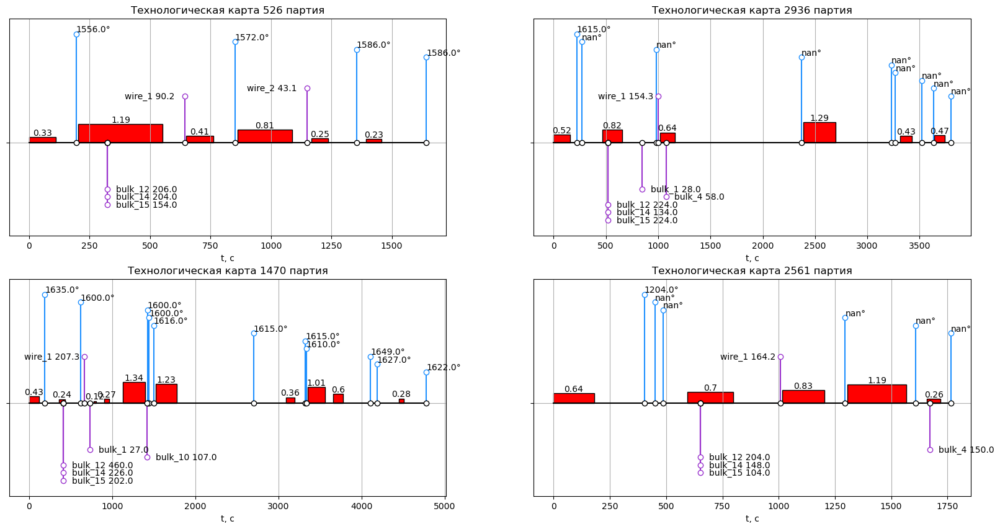

In [42]:
nrows = 2
ncols = 2
rand_key = np.random.randint(1,3081,(nrows,ncols))
#rand_key = np.array([[1,1],[3,4],[5,6],[7,8],[9,10]])
fig, ax = plt.subplots(figsize=(20, 10),nrows=nrows,ncols=ncols)
for i in range(nrows):
    for j in range(ncols):
        timeline_data(ax[i,j],rand_key[i,j],data_temp,data_arc,data_bulk, data_bulk_time, data_wire, data_wire_time)       

Вывод на экран параметров заданной партии:

In [43]:
key=1379
display(data_arc[data_arc['key']==key])
display(data_temp[data_temp['key']==key])
display(data_bulk[data_bulk['key']==key])
display(data_wire[data_wire['key']==key])

,key,t_arc_start,t_arc_finish,p_active,p_reactive
6339,1379,2019-06-22 05:31:05,2019-06-22 05:33:17,0.508195,0.409922
6340,1379,2019-06-22 05:37:12,2019-06-22 05:44:11,1.755735,1.311710
6341,1379,2019-06-22 05:45:12,2019-06-22 05:48:26,0.837190,0.615102


,key,t_meas,temp
6824,1379,2019-06-22 05:35:14,1665.0
6825,1379,2019-06-22 05:36:57,1639.0
6826,1379,2019-06-22 05:44:59,1660.0
6827,1379,2019-06-22 05:49:03,1674.0


,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15
1327,1379,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,105.0,NaN,NaN,NaN


,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9


По итогу изучения технологических карт можно сделать следующие выводы:
1. Часть данных не содержит целевого параметра - последнего измерения температуры перед разливкой заготовок. Более того во многих таких случаях отсутствуют и несколько предыдущих измерений.
2. Обнаружено большое количество нарушений описанного в условии техпроцесса в части времени добавления легирующих компонентов. Так по данным легирующие компоненты могут добавляться в процессе нагрева, далеко не перед каждым нагревом происходит добавление легирующих компонент. После уточнения у тимлида выяснилось, что времена в таблицах по легирующим компонентам могут быть ошибочными и на них не стоит ориентироваться.
3. Встречаются партии, в которых первому измерению температуры предшествует один или несколько циклов нагрева, что противоречию описанию тех процесса. Вероятно время первого измерения также может быть определено ошибочно.

## 4.4. <a id='toc4_4_'></a>[<font color='#42AAFF'>Анализ измерений температуры</font>](#toc0_)

Определим количество партий, для которых неизвестна финальная целевая температура:

In [44]:
data_temp.head()

,key,t_meas,temp
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0


In [45]:
key_nan_temp = [k for k in data_temp['key'].unique() if data_temp.query('key==@k')['temp'][-1:].isna().bool()]
print(f'Кол-во партий с неизвестной финальной температурой: {len(key_nan_temp)}')

Кол-во партий с неизвестной финальной температурой: 739


In [46]:
data_temp.query('key in @key_nan_temp').head(10)

,key,t_meas,temp
12267,2500,2019-08-06 03:11:31,1539.0
12268,2500,2019-08-06 03:24:43,NaN
12269,2500,2019-08-06 03:25:16,NaN
12270,2500,2019-08-06 03:28:21,NaN
12271,2501,2019-08-06 03:44:42,1587.0
12272,2501,2019-08-06 04:01:59,NaN
12273,2501,2019-08-06 04:14:35,NaN
12274,2501,2019-08-06 04:22:14,NaN
12275,2501,2019-08-06 04:31:14,NaN
12276,2502,2019-08-06 04:45:26,1583.0


Финальная температура является целевым параметром и мы не можем её восстановить, поэтому удалим данные из таблицы для партий без финальной температуры:

In [47]:
data_temp = data_temp.query('key not in @key_nan_temp')

In [48]:
data_temp.isna().sum()

key       0
t_meas    0
temp      0
dtype: int64

После удаления партий с неизвестной финальной температурой пропусков в таблице `data_temp` не осталось.

Рассмотрим распределения первой и финальной температур по партиям:

In [49]:
data_temp.head()

,key,t_meas,temp
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0


In [50]:
df_temp = pd.DataFrame(data_temp['key'].unique(),columns={'key'}).set_index('key')
df_temp['T1'] = data_temp.groupby('key')['temp'].nth(0).values
df_temp['T'] = data_temp.groupby('key')['temp'].nth(-1).values
df_temp['count'] = data_temp.groupby('key').agg({'temp':'count'})

In [51]:
df_temp.head()

,T1,T,count
key,,,
1,1571.0,1613.0,5
2,1581.0,1602.0,6
3,1596.0,1599.0,5
4,1601.0,1625.0,3
5,1576.0,1602.0,2


In [52]:
data_agg = df_temp.agg(
    ['count','mean','std',np.var,'min',lambda x: x.quantile(0.1),lambda x: x.quantile(0.25),lambda x: x.quantile(0.5),
    lambda x: x.quantile(0.75),lambda x: x.quantile(0.9),'max', lambda x: x.skew(), lambda x: x.kurtosis()])
data_agg.index=['count', 'mean', 'std', 'var', 'min', '10%', '25%', '50%','75%', '90%', 'max','skewness','kurtosis']
data_agg.applymap('{:.1f}'.format).T

,count,mean,std,var,min,10%,25%,50%,75%,90%,max,skewness,kurtosis
T1,2477.0,1588.4,29.2,854.6,1191.0,1559.0,1572.0,1588.0,1605.0,1622.0,1679.0,-3.3,44.0
T,2477.0,1595.3,16.0,256.6,1541.0,1580.0,1587.0,1593.0,1599.0,1613.0,1700.0,2.2,8.4
count,2477.0,5.0,1.8,3.3,1.0,3.0,4.0,5.0,6.0,7.0,16.0,1.5,4.2


По данным тимлида известно, что исходная температура расплава не может быть менее 1400 градусов чисто физически, то есть настолько низкая T1 является ошибкой, исключим такии партии из рассмотрения (таких партий всего 4).

In [53]:
df_temp[df_temp['T1']<=1400]

,T1,T,count
key,,,
867,1191.0,1599.0,6
1214,1208.0,1591.0,16
1619,1218.0,1590.0,5
2052,1227.0,1592.0,5


Для анализа также не подходят данные в которых сделано всего лишь 1 измерение температуры, так как такое описание физически недостаточно для описания теплового баланса. Таких партий немного (2), исключим их из рассмотрения.

In [54]:
df_temp[df_temp['count']==1]

,T1,T,count
key,,,
195,1583.0,1583.0,1
279,1603.0,1603.0,1


In [55]:
df_temp = df_temp[df_temp['T1']>1400]
df_temp = df_temp[df_temp['count']>1]
data_temp = data_temp.query('key in @df_temp.index')

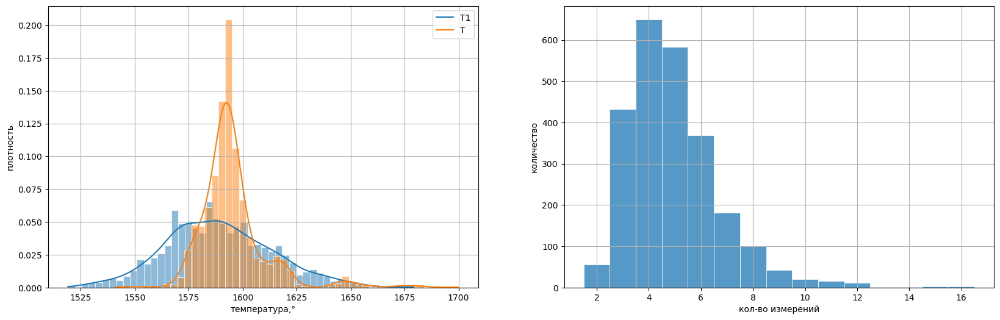

In [56]:
fig, axs = plt.subplots(ncols=2,figsize=(20,6))
h1 = sns.histplot(x=df_temp['T1'], bins=50, linewidth=0.5,color=sns.color_palette()[0], edgecolor="white",stat='probability',kde=True,ax=axs[0])
h2 = sns.histplot(x=df_temp['T'], bins=50, linewidth=0.5,color=sns.color_palette()[1], edgecolor="white",stat='probability',kde=True,ax=axs[0])
axs[0].grid(True)
axs[0].set(
    xlabel='температура,'+u'\N{DEGREE SIGN}',
    ylabel='плотность',    
    title='')
axs[0].legend(['T1', 'T'])    

h = sns.histplot(x=df_temp['count'],linewidth=0.5,color=sns.color_palette()[0], edgecolor="white",stat='count',discrete=True,ax=axs[1])
axs[1].grid(True)
axs[1].set(
    xlabel='кол-во измерений',
    ylabel='количество',    
    title='')
plt.show()

Отметим, что финальные температуры могут достигать 1700 градусов, однако у нас нет оснований считать такие данные ошибочными. Во всех оставшихся партиях имеется как минимум 2 измерения температуры.

## 4.5. <a id='toc4_5_'></a>[<font color='#42AAFF'>Анализ параметров циклов нагрева</font>](#toc0_)

Рассмотрим данные только по тем партиям, которые уже отобрали в предыдущем разделе.

In [57]:
data_arc = data_arc.query('key in @df_temp.index')

In [58]:
data_arc.head()

,key,t_arc_start,t_arc_finish,p_active,p_reactive
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397


In [59]:
data_agg = data_arc[['p_active','p_reactive']].agg(
    ['count','mean','std',np.var,'min',lambda x: x.quantile(0.1),lambda x: x.quantile(0.25),lambda x: x.quantile(0.5),
    lambda x: x.quantile(0.75),lambda x: x.quantile(0.9),'max', lambda x: x.skew(), lambda x: x.kurtosis()])
data_agg.index=['count', 'mean', 'std', 'var', 'min', '10%', '25%', '50%','75%', '90%', 'max','skewness','kurtosis']
data_agg.applymap('{:.1f}'.format).T

,count,mean,std,var,min,10%,25%,50%,75%,90%,max,skewness,kurtosis
p_active,11432.0,0.7,0.4,0.2,0.0,0.3,0.4,0.6,0.9,1.2,3.7,1.5,3.4
p_reactive,11432.0,0.4,6.7,44.9,-715.5,0.2,0.3,0.4,0.6,0.9,2.7,-106.6,11382.9


In [60]:
data_arc[data_arc['p_reactive']<0]

,key,t_arc_start,t_arc_finish,p_active,p_reactive
9780,2116,2019-07-24 00:44:48,2019-07-24 00:46:37,0.495782,-715.504924


В таблице имеется единственное отрицательное значение реактивной мощности (с физической точки зрения отрицательная реактивная мощность соответствует емкостному типу нагрузки, тогда как для нагрева применяются индукционные печи, которые относятся к индуктивному типу нагрузки). Если для нагрева применяется один и тот же силовой контур, то активная и реактивная мощности должны быть скоррелированы и отличаются тангенсом сдвига фаз между током и напряжением. Проверим это утверждение.

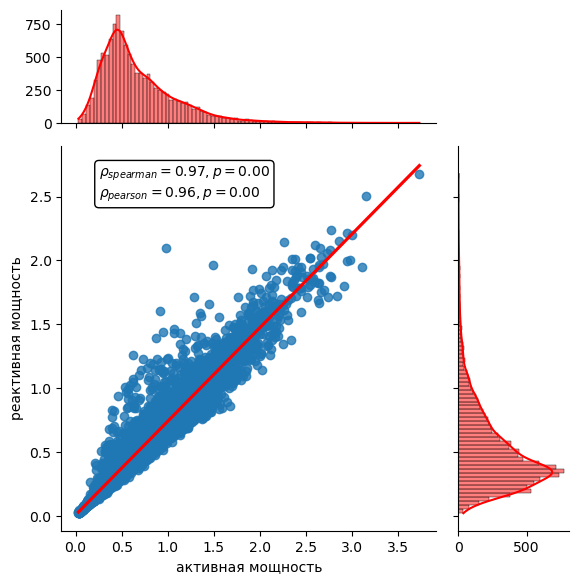

In [61]:
fig = sns.jointplot(data=data_arc.query('p_reactive>=0'), x='p_active', y='p_reactive', kind="reg", marginal_kws=dict(color='r'), line_kws={"color": "red"}, ratio=3, marginal_ticks=True)
fig.set_axis_labels('активная мощность', 'реактивная мощность')
sp1 = st.spearmanr(data_arc.query('p_reactive>=0')['p_active'], data_arc.query('p_reactive>=0')['p_reactive'])
p1 = st.pearsonr(data_arc.query('p_reactive>=0')['p_active'], data_arc.query('p_reactive>=0')['p_reactive'])
fig.ax_joint.annotate(
    f'$\\rho_{{spearman}} = {sp1.correlation:.2f},p = {sp1.pvalue:.2f}$\n'
    f'$\\rho_{{pearson}} = {p1[0]:.2f},p = {p1[1]:.2f}$',    
    xy=(0.1, 0.9), xycoords='axes fraction', ha='left', va='center', bbox={'boxstyle': 'round', 'fc': 'white'})
plt.show()

Получили коэффициент корреляции близкий к 1. Таким образом, ни с точки зрения понимания физики процесса, ни со статистической точки зрения нет необходимости учёта влияния реактивной мощности на финальную температуру расплава. 

Определим продолжительность и активную мощность на каждой итерации нагрева:

In [62]:
data_arc['dt'] = (data_arc['t_arc_finish'] - data_arc['t_arc_start']).dt.total_seconds()
data_arc['q_active'] = data_arc['dt']*data_arc['p_active']

In [63]:
data_agg = data_arc[['dt','q_active']].agg(
    ['count','mean','std',np.var,'min',lambda x: x.quantile(0.1),lambda x: x.quantile(0.25),lambda x: x.quantile(0.5),
    lambda x: x.quantile(0.75),lambda x: x.quantile(0.9),'max', lambda x: x.skew(), lambda x: x.kurtosis()])
data_agg.index=['count', 'mean', 'std', 'var', 'min', '10%', '25%', '50%','75%', '90%', 'max','skewness','kurtosis']
data_agg.applymap('{:.1f}'.format).T

,count,mean,std,var,min,10%,25%,50%,75%,90%,max,skewness,kurtosis
dt,11432.0,173.0,98.6,9727.0,11.0,70.0,108.0,147.0,218.0,304.0,907.0,1.5,3.2
q_active,11432.0,156.2,207.2,42923.1,0.3,18.7,43.6,81.9,187.5,372.8,3384.6,3.8,23.2


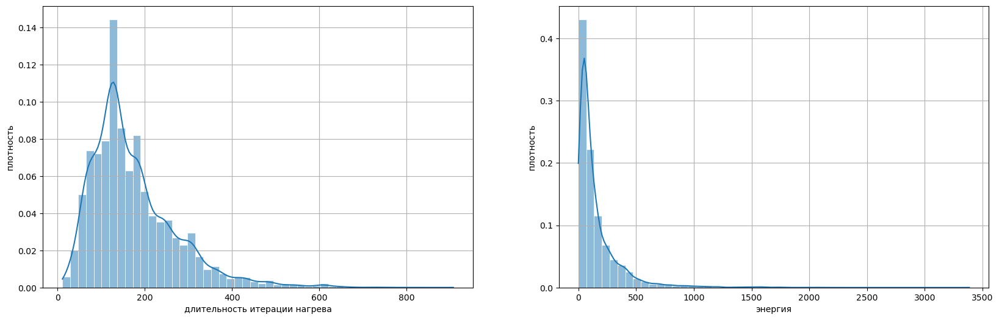

In [64]:
fig, axs = plt.subplots(ncols=2,figsize=(20,6))
h = sns.histplot(x=data_arc['dt'], bins=50, linewidth=0.5,color=sns.color_palette()[0], edgecolor="white",stat='probability',kde=True,ax=axs[0])
axs[0].grid(True)
axs[0].set(
    xlabel='длительность итерации нагрева',
    ylabel='плотность',    
    title='')


h = sns.histplot(x=data_arc['q_active'], bins=50, linewidth=0.5,color=sns.color_palette()[0], edgecolor="white",stat='probability',kde=True,ax=axs[1])
axs[1].grid(True)
axs[1].set(
    xlabel='энергия',
    ylabel='плотность',    
    title='')
plt.show()

Диапазон энергий нагрева довольно большой, для примера рассмотрим подробнее партию с самой большой энергией нагрева в итерации.

In [65]:
data_arc[data_arc.index == data_arc['q_active'].idxmax()]

,key,t_arc_start,t_arc_finish,p_active,p_reactive,dt,q_active
7799,1689,2019-07-02 18:49:03,2019-07-02 19:04:10,3.731596,2.676388,907.0,3384.557674


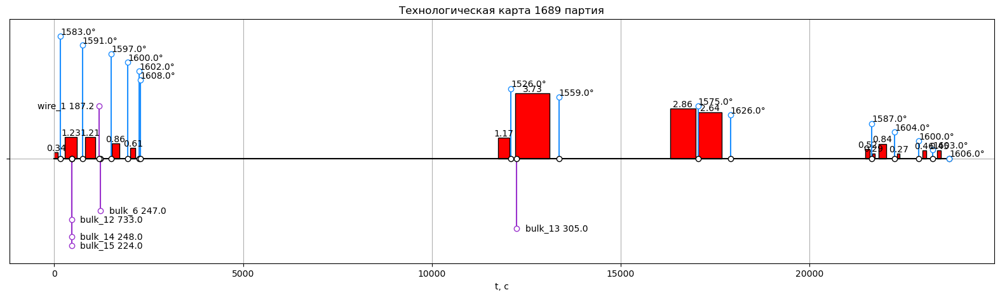

In [66]:
fig, ax = plt.subplots(figsize=(20, 5))
timeline_data(ax,1689,data_temp,data_arc,data_bulk, data_bulk_time, data_wire, data_wire_time)  

Как видно из технологической карты итерации с самой большой энергией нагрева предшествует дополнение большой массы легированного компонента и после нагрева температура сплава в целом увеличивается, т.е. каких-то выраженных противоречий здравому смыслу нет.

Рассчитаем полную энергию нагрева для каждой из партий:

In [67]:
df_arc = data_arc.groupby('key').agg({'q_active':'sum','dt':'sum'})

In [68]:
df_arc.head()

,q_active,dt
key,,
1,1207.804249,1098.0
2,733.816470,811.0
3,443.583327,655.0
4,670.663327,741.0
5,997.496095,869.0


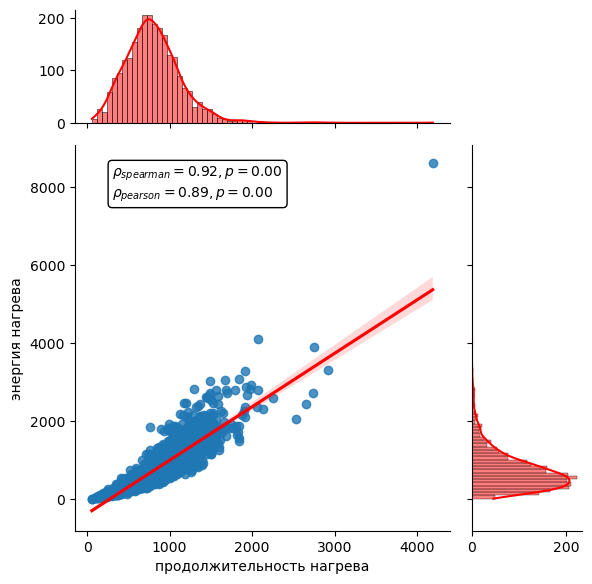

In [69]:
fig = sns.jointplot(data=df_arc, x='dt', y='q_active', kind="reg", marginal_kws=dict(color='r'), line_kws={"color": "red"}, ratio=3, marginal_ticks=True)
fig.set_axis_labels('продолжительность нагрева', 'энергия нагрева')
sp1 = st.spearmanr(df_arc['dt'], df_arc['q_active'])
p1 = st.pearsonr(df_arc['dt'], df_arc['q_active'])
fig.ax_joint.annotate(
    f'$\\rho_{{spearman}} = {sp1.correlation:.2f},p = {sp1.pvalue:.2f}$\n'
    f'$\\rho_{{pearson}} = {p1[0]:.2f},p = {p1[1]:.2f}$',
    xy=(0.1, 0.9), xycoords='axes fraction', ha='left', va='center', bbox={'boxstyle': 'round', 'fc': 'white'})
plt.show()

In [70]:
data_agg = df_arc[['dt','q_active']].agg(
    ['count','mean','std',np.var,'min',lambda x: x.quantile(0.1),lambda x: x.quantile(0.25),lambda x: x.quantile(0.5),
    lambda x: x.quantile(0.75),lambda x: x.quantile(0.9),'max', lambda x: x.skew(), lambda x: x.kurtosis()])
data_agg.index=['count', 'mean', 'std', 'var', 'min', '10%', '25%', '50%','75%', '90%', 'max','skewness','kurtosis']
data_agg.applymap('{:.1f}'.format).T

,count,mean,std,var,min,10%,25%,50%,75%,90%,max,skewness,kurtosis
dt,2471.0,800.3,340.8,116133.6,57.0,393.0,573.0,773.0,987.0,1211.0,4189.0,1.2,6.1
q_active,2471.0,722.8,526.1,276761.5,10.6,212.4,365.9,611.5,935.7,1339.1,8624.4,2.8,23.6


Как видно из графика выше энергия и суммарная продолжительность нагрева неплохо коррелируют даже с учётом выбросов, которые в дальнейшем мы не будем учитывать при обучении модели.

## 4.6. <a id='toc4_6_'></a>[<font color='#42AAFF'>Анализ объема газа</font>](#toc0_)

Будем рассматривать только уже отобранные выборки:

In [71]:
data_gas = data_gas.query('key in @df_temp.index')

In [72]:
data_gas.head()

,key,gas_1
0,1,29.749986
1,2,12.555561
2,3,28.554793
3,4,18.841219
4,5,5.413692


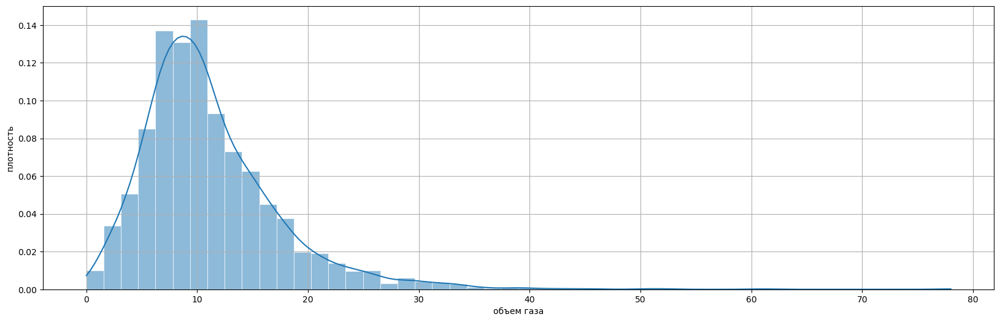

In [73]:
fig, axs = plt.subplots(figsize=(20,6))
h = sns.histplot(x=data_gas['gas_1'], bins=50, linewidth=0.5,color=sns.color_palette()[0], edgecolor="white",stat='probability',kde=True,ax=axs)
axs.grid(True)
axs.set(
    xlabel='объем газа',
    ylabel='плотность',    
    title='')
plt.show()

In [74]:
data_agg = data_gas[['gas_1']].agg(
    ['count','mean','std',np.var,'min',lambda x: x.quantile(0.1),lambda x: x.quantile(0.25),lambda x: x.quantile(0.5),
    lambda x: x.quantile(0.75),lambda x: x.quantile(0.9),'max', lambda x: x.skew(), lambda x: x.kurtosis()])
data_agg.index=['count', 'mean', 'std', 'var', 'min', '10%', '25%', '50%','75%', '90%', 'max','skewness','kurtosis']
data_agg.applymap('{:.1f}'.format).T

,count,mean,std,var,min,10%,25%,50%,75%,90%,max,skewness,kurtosis
gas_1,2469.0,11.1,6.3,40.0,0.0,4.8,7.1,9.9,13.9,18.7,78.0,2.0,9.7


Отметим, что объёмы газа существенно варьируются, распределение имеет скошенный вправо вид с выбросами, которые мы не будем учитывать при обучении модели.

## 4.7. <a id='toc4_7_'></a>[<font color='#42AAFF'>Массы легирующих компонент</font>](#toc0_)

Будем рассматривать только уже отобранные выборки:

In [75]:
data_bulk = data_bulk.query('key in @df_temp.index')
data_wire = data_wire.query('key in @df_temp.index')

Удалим полностью пустые столбцы:

In [76]:
data_bulk = data_bulk.drop(columns='bulk_8')
data_wire = data_wire.drop(columns='wire_5')

In [77]:
data_agg = data_bulk.agg(
    ['count','mean','std',np.var,'min',lambda x: x.quantile(0.1),lambda x: x.quantile(0.25),lambda x: x.quantile(0.5),
    lambda x: x.quantile(0.75),lambda x: x.quantile(0.9),'max', lambda x: x.skew(), lambda x: x.kurtosis()])
data_agg.index=['count', 'mean', 'std', 'var', 'min', '10%', '25%', '50%','75%', '90%', 'max','skewness','kurtosis']
data_agg.applymap('{:.1f}'.format).T

,count,mean,std,var,min,10%,25%,50%,75%,90%,max,skewness,kurtosis
key,2403.0,1251.2,716.8,513822.1,1.0,257.2,631.5,1253.0,1867.5,2245.8,2499.0,-0.0,-1.2
bulk_1,199.0,40.1,18.2,332.2,10.0,27.0,27.0,33.0,46.5,54.8,185.0,3.2,19.9
bulk_2,13.0,254.8,26.0,674.6,228.0,232.2,242.0,248.0,258.0,279.6,325.0,1.8,3.9
bulk_3,963.0,114.8,77.2,5966.6,6.0,29.0,57.5,97.0,152.0,224.0,454.0,1.2,1.4
bulk_4,813.0,107.1,49.1,2411.3,13.0,47.0,73.0,105.0,137.0,171.0,281.0,0.6,0.4
bulk_5,53.0,116.0,95.2,9061.0,11.0,31.4,70.0,88.0,148.0,195.4,603.0,2.8,12.3
bulk_6,443.0,119.2,70.5,4975.6,17.0,49.0,72.0,100.0,155.5,218.8,503.0,1.4,2.8
bulk_7,14.0,336.9,217.3,47205.5,47.0,80.1,160.8,349.0,481.8,569.1,772.0,0.4,-0.6
bulk_9,13.0,79.7,25.8,665.4,63.0,65.0,66.0,68.0,71.0,110.4,147.0,1.9,3.1
bulk_10,143.0,82.3,27.8,772.2,24.0,46.2,58.0,85.0,104.0,114.6,159.0,-0.0,-0.3


In [78]:
data_agg = data_wire.agg(
    ['count','mean','std',np.var,'min',lambda x: x.quantile(0.1),lambda x: x.quantile(0.25),lambda x: x.quantile(0.5),
    lambda x: x.quantile(0.75),lambda x: x.quantile(0.9),'max', lambda x: x.skew(), lambda x: x.kurtosis()])
data_agg.index=['count', 'mean', 'std', 'var', 'min', '10%', '25%', '50%','75%', '90%', 'max','skewness','kurtosis']
data_agg.applymap('{:.1f}'.format).T

,count,mean,std,var,min,10%,25%,50%,75%,90%,max,skewness,kurtosis
key,2368.0,1251.2,716.3,513081.4,1.0,258.7,628.8,1254.5,1869.2,2245.3,2499.0,-0.0,-1.2
wire_1,2344.0,103.3,42.6,1815.5,1.9,50.0,74.2,102.0,128.9,158.1,330.3,0.3,0.5
wire_2,831.0,50.9,40.1,1607.6,0.0,11.2,20.2,40.1,70.1,105.3,282.8,1.5,3.0
wire_3,39.0,193.2,100.9,10174.3,0.1,89.8,93.2,237.0,277.1,282.7,385.0,-0.5,-1.0
wire_4,12.0,59.5,30.8,948.9,24.1,25.9,38.3,49.7,84.8,102.0,113.2,0.6,-1.0
wire_6,45.0,50.7,37.7,1424.5,0.1,13.5,25.1,40.1,65.0,95.5,180.5,1.5,2.7
wire_7,4.0,3.7,3.8,14.6,0.2,0.5,0.8,3.0,5.9,7.5,8.5,0.6,-2.2
wire_8,13.0,55.8,20.2,409.5,45.1,45.1,46.0,46.2,46.3,89.9,102.8,1.9,2.2
wire_9,28.0,35.1,19.6,385.2,4.6,11.0,23.2,30.1,44.9,62.3,90.1,0.8,0.8


Массы легирующих компонент не содержат нефизичных значений, но имеют выбросы.

## 4.8. <a id='toc4_8_'></a>[<font color='#42AAFF'>Вывод</font>](#toc0_)

1. Привели название столбцов в соответствие PEP8.
2. Скорректировали типы данных.
3. Исследовали технологические карты легирования различных партий материала и выявили ряд несоответствий:
    - Часть данных не содержит целевого параметра - последнего измерения температуры перед разливкой заготовок. Более того во многих таких случаях отсутствуют и несколько предыдущих измерений.
    - Обнаружено большое количество нарушений в части времени добавления легирующих компонентов. Так по данным легирующие компоненты могут добавляться в процессе нагрева, далеко не перед каждым нагревом происходит добавление легирующих компонент. После уточнения у тимлида выяснилось, что времена в таблицах по легирующим компонентам могут быть ошибочными и на них не стоит ориентироваться.
    - Встречаются партии, в которых первому измерению температуры предшествует один или несколько циклов нагрева, что противоречию описанию тех процесса. Вероятно время первого измерения также может быть определено ошибочно.
4. Исключили из рассмотрения партии с неполными данными и данные, не имеющими физического смысла:
    - без финальной температуры;
    - с исходной температурой ниже температуры плавления (<1400 градусов);
    - с 1м измерением температуры;
    - данные по реактивной мощности, так как с физической точки зрения они не влияют на нагрев стали, кроме того реактивная и активная мощность коррелируют с коэффициентом корреляции 0.97;
    - удалили пустые столбцы c массами bulk_8 и wire_5
5. Практически все исходные параметры имеют выбросы, которые физически вполне возможны, поэтому имеет смысл эти выбросы исключить в обучающей выборке и не исключать в тестовой.    

# 5. <a id='toc5_'></a>[<font color='#42AAFF'>Подготовка признаков для обучения моделей</font>](#toc0_)

## 5.1. <a id='toc5_1_'></a>[<font color='#42AAFF'>Формирование таблиц признаков</font>](#toc0_)

В теоретической части мы сформулировали признаки, которые могут иметь физический смысл:

1. $\mathbf{T_1}$ - температура 1го измерения
2. $\mathbf{\sum\limits _{i} ^{}P_i \Delta t_i}$ - суммарная энергия нагрева электродами в интервале температур между $T_1$ и $T$
3. $\mathbf{m_b}$ - массы сыпучих легирующих компонент
4. $\mathbf{m_w}$ - массы проволочных легирующих компонент
5. $\mathbf{\Delta t}$ - интервал времени между первым и последним измерениями температур
6. $\mathbf{\bar{T}\Delta t}$ - произведение средневзвешенной температуры расплава и интервала времени между крайними измерениями
7. $\mathbf{\bar{T}^4\Delta t}$ - произведение средневзвешенной температуры расплава в 4 степени и интервала времени между крайними измерениями
8. $\mathbf{V}$ - объем газа
9. $\mathbf{V^{0.5}}$ - корень кв. из объема газа
10. $\mathbf{V\bar{T}}$ - произведение объема газа на средневзвешенную температуру
11. $\mathbf{V^{0.5}\bar{T}}$ - произведение корня кв. из объема газа на средневзвешенную температуру

В результате изучения данных и обсуждения с тимлидом стало понятно, что полагаться точки во времени надо с осторожностью, поэтому предложенный ниже способ вычисления признаков надо рассматривать лишь как один из возможных:

1. Длительность итерации нагрева считаем честно, вычитая из времени конца итерации время начала итерации. При расчёте признака $\mathbf{\sum\limits _{i} ^{}P_i \Delta t_i}$ суммирование выполняем по всем итерациям.
2. Средневзвешенную температуру $\mathbf{\bar{T}}$ будем вычислять упрощенно как среднее арифметическое измерений температуры, кроме финальной.
3. Длительность легирования $\mathbf{\Delta t}$ будем вычислять в виде разности максимума из времени финальной измерения температуры, времени окончания последней итерации нагрева и минимального из времени начала 1й итерации нагрева, времени 1го измерения температуры.

Из обсуждения с тимлидом стало понятно, что знание $\bar{T}$, даже в том виде, как оно определено выше, будет не всегда доступно. Например, в случае необходимости построения прогноза для нового ковша будет известна только входная температура, а остальные температуры - нет.

В этом случае предлагается заменить $\bar{T}$ на $T_1$ как некоторое нулевое приближение этой величины. Подготовим такую таблицу признаков:

Добавим в таблицу $T$ и $T_1$:

In [79]:
data = df_temp[['T1','T']]

Добавим в таблицу $\mathbf{\sum\limits _{i} ^{}P_i \Delta t_i}$

In [80]:
data = data.join(data_arc.set_index('key')['q_active'].groupby('key').agg('sum').round(1),how='left')

Покажем явно, что в data_bulk для всех интересующих партий есть как минимум одна присадка:

In [81]:
data_bulk[data_bulk.isna().T.sum()==14]

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15


Покажем явно, что в data_wire для всех интересующих партий есть как минимум одна присадка:

In [82]:
data_wire[data_wire.isna().T.sum()==8]

,key,wire_1,wire_2,wire_3,wire_4,wire_6,wire_7,wire_8,wire_9


Добавим массы легирующих компонент $\mathbf{m_b}$ и $\mathbf{m_w}$

In [83]:
data = data.join(data_bulk.set_index('key').round(1),how='inner').fillna(0)
data = data.join(data_wire.set_index('key').round(1),how='inner').fillna(0)

Добавим длительность легирования $\mathbf{\Delta t}$ :

In [84]:
data = data.join(data_temp.groupby('key')['t_meas'].agg({'min','max'}),how='left')
data = data.join(data_arc.set_index('key').groupby('key').agg({'t_arc_start':'min','t_arc_finish':'max'}),how='left')
data['dt'] = data.apply(lambda x: np.max([x['t_arc_finish'],x['max']]) - np.min([x['t_arc_start'],x['min']]),axis=1).dt.total_seconds()
data = data.drop(columns={'min','max','t_arc_start','t_arc_finish'})

Добавим объем газа $\mathbf{V}$:

Покажем, что во всех интересующих нас партиях есть подача газа:

In [85]:
data_gas['gas_1'].isna().sum()

0

In [86]:
data = data.join(data_gas.set_index('key')['gas_1'].round(1),how='inner').fillna(0)

In [87]:
data = data.rename(columns={'gas_1':'V','temp':'T_mean'})

Вычислим остальные признаки:

In [88]:
data['V05'] = np.round(data['V']**0.5,1)
data['VT'] = np.round(data['V']*data['T1'],1)
data['V05T'] = np.round(data['V05']*data['T1'],1)
data['Tdt'] = np.round(data['dt']*data['T1'],1)
data['T4dt'] = np.round(data['dt']*(data['T1'])**4,1)

In [89]:
data.head()

,T1,T,q_active,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,wire_1,wire_2,wire_3,wire_4,wire_6,wire_7,wire_8,wire_9,dt,V,V05,VT,V05T,Tdt,T4dt
key,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,1571.0,1613.0,1207.8,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,60.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1705.0,29.7,5.4,46658.7,8483.4,2678555.0,1.038554e+16
2,1581.0,1602.0,733.8,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,96.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1498.0,12.6,3.5,19920.6,5533.5,2368338.0,9.359212e+15
3,1596.0,1599.0,443.6,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,91.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1683.0,28.6,5.3,45645.6,8458.8,2686068.0,1.091982e+16
4,1601.0,1625.0,670.7,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,89.1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1188.0,18.8,4.3,30098.8,6884.3,1901988.0,7.805159e+15
5,1576.0,1602.0,997.5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,89.2,9.1,0.0,0.0,0.0,0.0,0.0,0.0,1488.0,5.4,2.3,8510.4,3624.8,2345088.0,9.179685e+15


In [90]:
data.shape

(2325, 32)

## 5.2. <a id='toc5_2_'></a>[<font color='#42AAFF'>Подготовка выборок</font>](#toc0_)

Выполним разбиение на целевой и остальные признаки.

In [91]:
features = data.drop('T',axis=1)
target = data['T']

Разбиваем данные на 2 выборки:
1. Обучающая (80%)
2. Тестовая (20%)

In [92]:
features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.2, random_state=12092022)

## 5.3. <a id='toc5_3_'></a>[<font color='#42AAFF'>Стандартизация признаков</font>](#toc0_)

Признаки имеют разные масштабы, приведем их к одному масштабу с помощью процедуры стандартизации. Обучим процедуру на тренировочной выборке и применим ее ко всем данным.

In [93]:
#отключаем вывод предупреждения SettingWithCopy
pd.options.mode.chained_assignment = None

scaler = StandardScaler()
scaler.fit(features_train)
features_train[features_train.columns] = scaler.transform(features_train)
features_test[features_test.columns] = scaler.transform(features_test)

## 5.4. <a id='toc5_4_'></a>[<font color='#42AAFF'>Исключение мультиколлинеарных признаков</font>](#toc0_)

Подготовим функцию для определения VIF (Variance Inflation Factor):

In [94]:
def variance_inflation_factors(x):
    model = LinearRegression()
    vif = pd.DataFrame(columns=['features','vif'])
    for i in range(x.shape[1]):        
        x_i = x.drop(x.columns[i], axis=1)
        y_i = x[x.columns[i]]
        model_i = model.fit(x_i, y_i)
        y_i_pred = model_i.predict(x_i)        
        r2_i = r2_score(y_i, y_i_pred)        
        vif_i = 1 / (1 - r2_i)
        vif.loc[i,'features'] = x.columns[i]
        vif.loc[i,'vif'] = vif_i
        vif = vif.sort_values(by='vif',ascending=False).reset_index(drop=True)
    return vif

Вычислим VIF для исходного набора признаков:

In [95]:
variance_inflation_factors(features_train).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30
features,Tdt,dt,T4dt,V,VT,V05,V05T,T1,bulk_9,wire_8,bulk_2,wire_4,q_active,bulk_7,bulk_12,wire_6,bulk_15,bulk_14,wire_7,wire_1,bulk_4,bulk_1,bulk_6,wire_2,bulk_5,bulk_13,bulk_3,wire_3,bulk_10,bulk_11,wire_9
vif,1673637.907374,943418.903535,105447.951434,90577.903863,90248.014911,88664.554022,88446.543593,80.24825,16.50966,16.507595,4.017083,3.769911,3.198554,2.964814,2.813083,1.895536,1.848937,1.71141,1.648782,1.500879,1.422539,1.414426,1.345134,1.217789,1.187798,1.175502,1.156322,1.14582,1.074246,1.06495,1.060106


Как видно из таблицы несколько признаков имеют VIF>5, что указывает на наличие коллинеарных выбранному признаков в наборе. Будем итерационно убирать по одному признаку из исходного набора с наибольшим VIF, пересчитывая VIF на каждой итерации, до тех пор пока все VIF не окажутся < 5. Для этого напишем рекурсивную функцию.

In [96]:
def mc_exclude_iterative(x):
    vif = variance_inflation_factors(x)    
    if vif.loc[0,'vif']>5:              
        vif = mc_exclude_iterative(x.drop(vif.loc[0,'features'], axis=1))
    return vif

In [97]:
vif = mc_exclude_iterative(features_train)
vif.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
features,bulk_2,wire_4,q_active,bulk_7,bulk_12,dt,T1,wire_6,bulk_15,bulk_14,wire_7,wire_1,bulk_4,V05,bulk_1,bulk_6,wire_2,bulk_5,bulk_13,bulk_3,wire_3,bulk_10,bulk_11,wire_9,wire_8
vif,3.836769,3.708388,3.016028,2.828652,2.789751,2.513046,1.915488,1.888492,1.813616,1.701293,1.639776,1.47813,1.417895,1.412406,1.369746,1.324262,1.205803,1.187382,1.163216,1.151227,1.142931,1.072696,1.060793,1.056284,1.018141


Таким образом, сократили количество признаков с 32 до 24.

In [98]:
features_train = features_train[vif.features]
features_test = features_test[vif.features]

## 5.5. <a id='toc5_5_'></a>[<font color='#42AAFF'>Вывод</font>](#toc0_)

1. Сформировали таблицу признаков на основе физических представлений о модели.
2. Разбили данные на целевой и остальные признаки, а также на тренировочную и тестовую выборки в соотношении 80/20.
3. Стандартизировали нецелевые признаки. Модель обучена на тренировочной части и применена ко всем данным.
4. Исключили мультиколлинеарные признаки с помощью Variance Inflation Factor.

# 6. <a id='toc6_'></a>[<font color='#42AAFF'>Обучение моделей</font>](#toc0_)

Зададим кроссвалидационное разбиение:

In [99]:
folds = KFold(n_splits = 5, shuffle = True, random_state = 12092022)

## 6.1. <a id='toc6_1_'></a>[<font color='#42AAFF'>Линейная регрессия</font>](#toc0_)

Подготовим функцию для отбора признаков методом RFE на кроссвалидации и построения графика зависимости MAE от количества признаков:

In [100]:
def lin_reg_rfecv(features_train,target_train,folds,score_name,score_name_display):    
    #задаем диапазон возможных значений числа признаков
    hyper_params = [{'n_features_to_select': list(range(1, len(features_train.columns)))}]
    #определяем модель
    model = LinearRegression()
    model.fit(features_train, target_train)
    rfe = RFE(model)  
    #оптимизируем модель с помощью GridSearchCV по количеству отобранных признаков
    model_cv = GridSearchCV(
        estimator = rfe, 
        param_grid = hyper_params, 
        scoring= score_name, 
        cv = folds, 
        verbose = 0,
        return_train_score=True)  
    model_cv.fit(features_train, target_train)
    cv_results = pd.DataFrame(model_cv.cv_results_)

    cols_test = list(cv_results.columns)[list(cv_results.columns).index('params')+1:list(cv_results.columns).index('mean_test_score')]
    cols_train = list(cv_results.columns)[list(cv_results.columns).index('rank_test_score')+1:list(cv_results.columns).index('mean_train_score')]
    pivot_df = pd.DataFrame(columns=['n_features', score_name,'sample'])
    pivot_df['n_features'] = list(cv_results['param_n_features_to_select'])*2*len(cols_test)
    pivot_df['sample'] = (['train']*len(cv_results['param_n_features_to_select'])+['test']*len(cv_results['param_n_features_to_select']))*len(cols_test)
    score = cv_results[cols_train[0]]
    score = pd.concat([score, cv_results[cols_test[0]]],ignore_index=True)
    for ind in range(1,len(cols_test)):
        score = pd.concat([score, cv_results[cols_train[ind]]],ignore_index=True)
        score = pd.concat([score, cv_results[cols_test[ind]]],ignore_index=True)    
    pivot_df[score_name] = abs(score)
    fig, axs = plt.subplots(figsize=(10,6))
    sns.lineplot(data=pivot_df,x='n_features',y=score_name,hue='sample',ci='sd',ax=axs)
    axs.grid(True)
    axs.set(title=f'Зависимость {score_name_display} от количества независимых признаков в модели')
    axs.set(ylabel=score_name_display)
    plt.show()
    return cv_results

Используя оценку RFE, исключим несущественные признаки по метрике MAE с применением кроссвалидации:

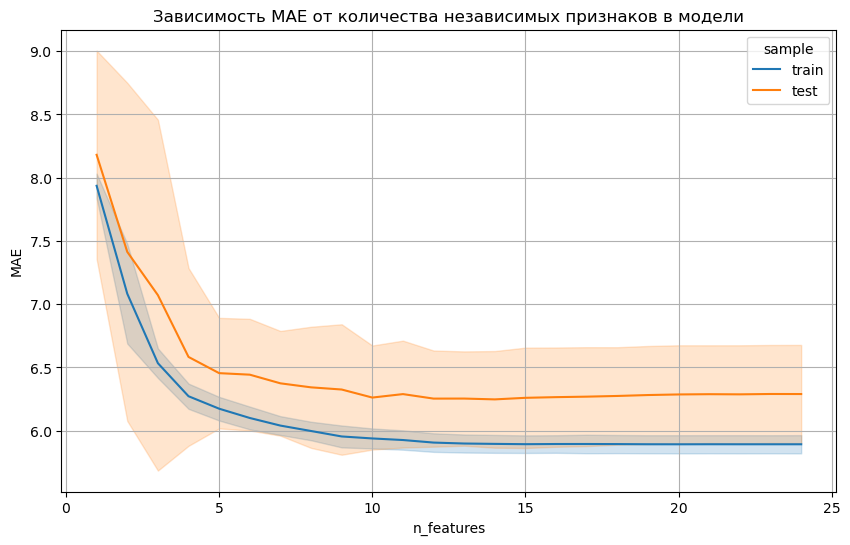

In [101]:
cv_results = lin_reg_rfecv(features_train,target_train,folds,'neg_mean_absolute_error','MAE')

Анализируя график, отметим что:
1. Модель линейной регрессии существенно переучивается (средние MAE на тренировочных и валидационных выборках существенно отличаются).
2. Стандартное отклонение на валидационных выборках значительно больше, чем на тренировочных. Вероятно сказывается зашумленность данных и наличие аномалий, существенно искажающих коэффициенты регрессии.

In [102]:
n_features_optimal = 3
model = LinearRegression()
rfe = RFE(model, n_features_to_select=n_features_optimal)   
rfe = rfe.fit(features_train, target_train)
final_model = rfe.estimator_

In [103]:
final_coeff = pd.DataFrame(columns=['feature','coeff'])
final_coeff['feature'] = list(rfe.get_feature_names_out())
final_coeff['coeff'] = final_model.coef_
final_coeff

,feature,coeff
0,q_active,9.465390
1,dt,-5.393633
2,T1,8.209014


Таким образом, наиболее существенно влияющими признаками оказались всего 3 признака:
1. Активная энергия подогрева сплава.
2. Средняя температура сплава в процессе легирования.
3. Длительность процесса легирования.

Состав признаков с физической точки зрения говорит о том, что:
1. Фактор индукционного нагрева в процессе легирования существенно влияет на финальную температуру (положительный коэффициент регрессии $q_{active}$).
2. Также существенную роль играет слагаемое с $T_1$, отвечающее за теплоту нагрева исходного расплава (положительный коэффициент ).
3. Основной механизм потери тепла, как оказалось, не связан с плавлением и нагревом легируюших компонент, вынужденной конвекцией потоком газа,излучением, а определяется некоторой эффективной теплоотдачей за весь интервал времени от начала процесса легирования до его окончания.

MAE стабилизируется примерно на ~15 признаках - добавляются в основном массы легирующих компонент. Большая часть масс, как и должно быть теоретически, имеют отрицательный коэффициент, так как расход тепла на нагрев легирующих компонент снижает температуру расплава, но у некоторых компонент коэффициент положительный (вероятно, в этом случае массы коррелируют с каким-то другим эффектом).

In [104]:
n_features_optimal = 15
model = LinearRegression()
rfe = RFE(model, n_features_to_select=n_features_optimal)   
rfe = rfe.fit(features_train, target_train)
final_model = rfe.estimator_
dump(final_model,'linreg_model.joblib')

['linreg_model.joblib']

In [105]:
final_coeff = pd.DataFrame(columns=['feature','coeff'])
final_coeff['feature'] = list(rfe.get_feature_names_out())
final_coeff['coeff'] = final_model.coef_
final_coeff

,feature,coeff
0,bulk_2,0.286155
1,wire_4,-1.063858
2,q_active,8.364192
3,bulk_7,0.297678
4,bulk_12,-0.489612
5,dt,-4.032085
6,T1,6.931752
7,bulk_15,1.360263
8,wire_7,-0.769369
9,wire_1,1.791211


## 6.2. <a id='toc6_2_'></a>[<font color='#42AAFF'>XGBoost</font>](#toc0_)

Попробуем добиться лучших результатов с помощью xgboost. Подготовим функцию, которая сначала на кроссвалидации определит оптимальные гиперпараметры модели, а затем на той же кроссвалидации выполнит рекурсивный отбор признаков по метрике MAE:

In [106]:
def xgb_rfecv(features_train,target_train,folds,score_name,score_name_display):
    est = xgb.XGBRegressor()
    params = {
        'max_depth': [2,4],
        'learning_rate' : [0.05, 0.1, 0.2],
        'n_estimators':[30,100],        
        'subsample': [0.8],
        'colsample_bytree': [0.7],
        'gamma':[10]
        }

    #оптимизируем модель с помощью GridSearchCV
    model_cv = GridSearchCV(
        estimator = est, 
        param_grid = params, 
        scoring = score_name, 
        n_jobs = -1,
        cv = folds, 
        verbose = 1
        )
    model_cv.fit(features_train, target_train)
    best_params = model_cv.best_params_
    print(f'Лучшая модель \n',
        f'Параметры модели: {best_params} \n',
        f'Усредненная оценка MAE для наилучшей модели: {model_cv.best_score_:1.1f} \n'
        f'Время обучения на тренировочной выборке: {model_cv.refit_time_:1.1f}'       
        ) 
    #задаем диапазон возможных значений числа признаков
    hyper_params = [{'n_features_to_select': list(range(1, len(features_train.columns)))}]
    #определяем модель
    model = xgb.XGBRegressor(**model_cv.best_params_)
    model.fit(features_train, target_train)
    rfe = RFE(model)
    model_cv = GridSearchCV(
        estimator = rfe, 
        param_grid = hyper_params, 
        scoring= score_name, 
        cv = folds, 
        verbose = 0,
        return_train_score=True)  
    model_cv.fit(features_train, target_train)
    cv_results = pd.DataFrame(model_cv.cv_results_)
    cols_test = list(cv_results.columns)[list(cv_results.columns).index('params')+1:list(cv_results.columns).index('mean_test_score')]
    cols_train = list(cv_results.columns)[list(cv_results.columns).index('rank_test_score')+1:list(cv_results.columns).index('mean_train_score')]
    pivot_df = pd.DataFrame(columns=['n_features', score_name,'sample'])
    pivot_df['n_features'] = list(cv_results['param_n_features_to_select'])*2*len(cols_test)
    pivot_df['sample'] = (['train']*len(cv_results['param_n_features_to_select'])+['test']*len(cv_results['param_n_features_to_select']))*len(cols_test)
    score = cv_results[cols_train[0]]
    score = pd.concat([score, cv_results[cols_test[0]]],ignore_index=True)
    for ind in range(1,len(cols_test)):
            score = pd.concat([score, cv_results[cols_train[ind]]],ignore_index=True)
            score = pd.concat([score, cv_results[cols_test[ind]]],ignore_index=True)    
    pivot_df[score_name] = abs(score)
    fig, axs = plt.subplots(figsize=(10,6))
    sns.lineplot(data=pivot_df,x='n_features',y=score_name,hue='sample',ci='sd',ax=axs)
    axs.grid(True)
    axs.set(title=f'Зависимость {score_name_display} от количества независимых признаков в модели')
    plt.show()
    return cv_results, best_params          

Fitting 5 folds for each of 12 candidates, totalling 60 fits


c:\ProgramData\Anaconda3\envs\ml\lib\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


Лучшая модель 
 Параметры модели: {'colsample_bytree': 0.7, 'gamma': 10, 'learning_rate': 0.1, 'max_depth': 4, 'n_estimators': 100, 'subsample': 0.8} 
 Усредненная оценка MAE для наилучшей модели: -5.9 
Время обучения на тренировочной выборке: 0.2


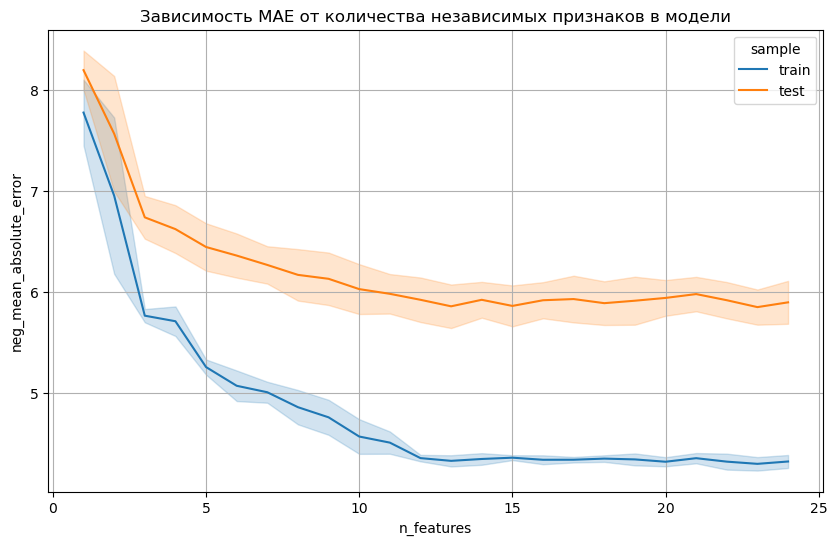

In [107]:
cv_results, best_params = xgb_rfecv(features_train,target_train,folds,'neg_mean_absolute_error','MAE')

Согласно полученным результатам можно сделать следующие выводы:
1. Модель прилично переучивается, но среднее и стандартное отклонение MAE на тестовых выборках позволяют рассчитывать на более интересный результат, чем в случае линейной регрессии.
2. Примерно после 12-15 признаков MAE перестает улучщаться.

In [108]:
n_features_optimal = 15
model = xgb.XGBRegressor(**best_params)
rfe = RFE(model, n_features_to_select=n_features_optimal)   
rfe = rfe.fit(features_train, target_train)
final_model = rfe.estimator_
dump(final_model, 'xgboost.joblib')

['xgboost.joblib']

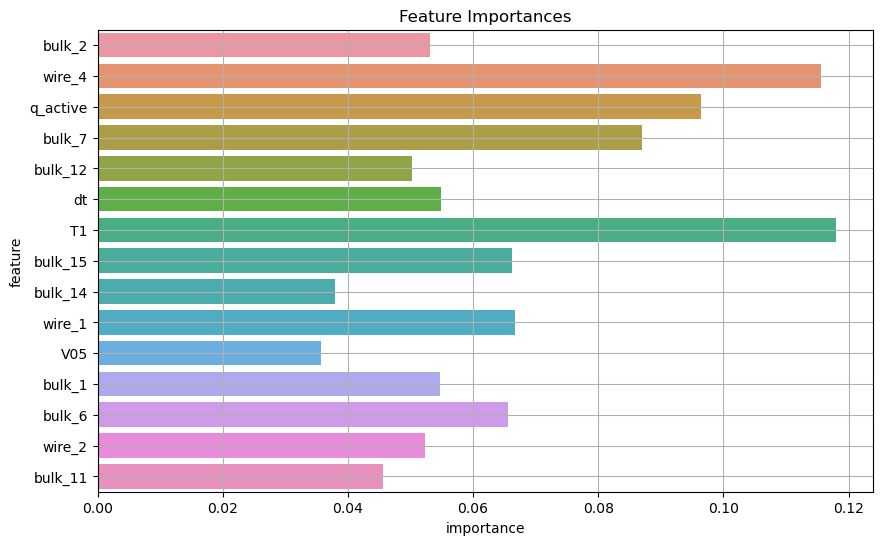

In [109]:
feature_names_01 = list(rfe.get_feature_names_out())
feature_importances = pd.DataFrame(columns=['feature','importance'])
feature_importances['feature'] = feature_names_01
feature_importances['importance'] = final_model.feature_importances_
fig, axs = plt.subplots(figsize=(10,6))
sns.barplot(data=feature_importances,x='importance',y='feature',orient='h',ax=axs)
axs.grid(True)
axs.set(title=f'Feature Importances')
plt.show()

Согласно диаграмме xgboost из 15 признаков выделяет 4 наиболее влияющих: q_active, wire_4, T1, bulk_7, остальные признаки также имеют существеннное, но близкое влияние. Отметим, что набор признаков существенно отличается от линейной регресии. Физические основания такого набора важных признаков сложно предполагать.

## 6.3. <a id='toc6_3_'></a>[<font color='#42AAFF'>LightGBM</font>](#toc0_)

In [110]:
def lgbm_rfecv(features_train,target_train,folds,score_name,score_name_display):
    est = lgb.LGBMRegressor()
    params = {
        'n_estimators':[10,50,100],
        'num_leaves': list(range(10,100,30)),
        #'min_data_in_leaf': [20,200,50],
        'max_depth': [4,6,8,10]  
        }

    #оптимизируем модель с помощью GridSearchCV
    model_cv = GridSearchCV(
        estimator = est, 
        param_grid = params, 
        scoring = score_name, 
        n_jobs = -1,
        cv = folds, 
        verbose = 1
        )
    model_cv.fit(features_train, target_train)
    best_params = model_cv.best_params_
    print(f'Лучшая модель \n',
        f'Параметры модели: {best_params} \n',
        f'Усредненная оценка MAE для наилучшей модели: {model_cv.best_score_:1.1f} \n'
        f'Время обучения на тренировочной выборке: {model_cv.refit_time_:1.1f}'       
        ) 
    #задаем диапазон возможных значений числа признаков
    hyper_params = [{'n_features_to_select': list(range(1, len(features_train.columns)))}]
    #определяем модель
    model = lgb.LGBMRegressor(**model_cv.best_params_)
    model.fit(features_train, target_train)
    rfe = RFE(model)
    model_cv = GridSearchCV(
        estimator = rfe, 
        param_grid = hyper_params, 
        scoring= score_name, 
        cv = folds, 
        verbose = 0,
        return_train_score=True)  
    model_cv.fit(features_train, target_train)
    cv_results = pd.DataFrame(model_cv.cv_results_)
    cols_test = list(cv_results.columns)[list(cv_results.columns).index('params')+1:list(cv_results.columns).index('mean_test_score')]
    cols_train = list(cv_results.columns)[list(cv_results.columns).index('rank_test_score')+1:list(cv_results.columns).index('mean_train_score')]
    pivot_df = pd.DataFrame(columns=['n_features', score_name,'sample'])
    pivot_df['n_features'] = list(cv_results['param_n_features_to_select'])*2*len(cols_test)
    pivot_df['sample'] = (['train']*len(cv_results['param_n_features_to_select'])+['test']*len(cv_results['param_n_features_to_select']))*len(cols_test)
    score = cv_results[cols_train[0]]
    score = pd.concat([score, cv_results[cols_test[0]]],ignore_index=True)
    for ind in range(1,len(cols_test)):
            score = pd.concat([score, cv_results[cols_train[ind]]],ignore_index=True)
            score = pd.concat([score, cv_results[cols_test[ind]]],ignore_index=True)    
    pivot_df[score_name] = abs(score)
    fig, axs = plt.subplots(figsize=(10,6))
    sns.lineplot(data=pivot_df,x='n_features',y=score_name,hue='sample',ci='sd',ax=axs)
    axs.grid(True)
    axs.set(title=f'Зависимость {score_name_display} от количества независимых признаков в модели')
    plt.show()
    return cv_results, best_params          

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Лучшая модель 
 Параметры модели: {'max_depth': 8, 'n_estimators': 100, 'num_leaves': 10} 
 Усредненная оценка MAE для наилучшей модели: -5.9 
Время обучения на тренировочной выборке: 0.1


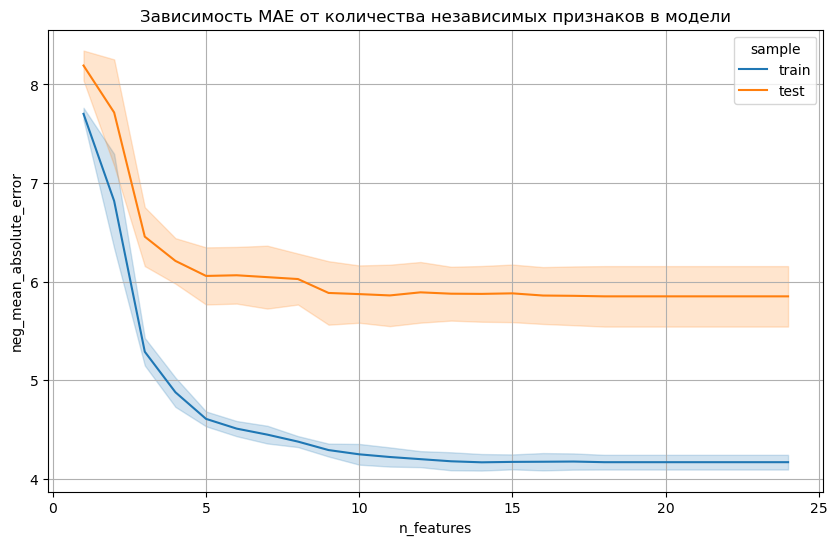

In [111]:
cv_results, best_params = lgbm_rfecv(features_train,target_train,folds,'neg_mean_absolute_error','MAE')

In [112]:
n_features_optimal = 15
model = lgb.LGBMRegressor(**best_params)
rfe = RFE(model, n_features_to_select=n_features_optimal)   
rfe = rfe.fit(features_train, target_train)
final_model = rfe.estimator_
dump(final_model, 'lgbm.joblib')

['lgbm.joblib']

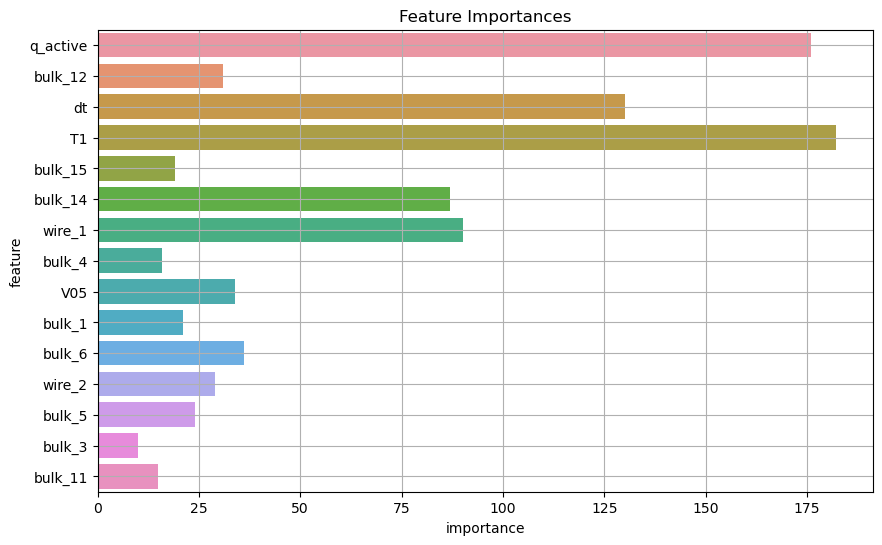

In [113]:
feature_names_02 = list(rfe.get_feature_names_out())
feature_importances = pd.DataFrame(columns=['feature','importance'])
feature_importances['feature'] = feature_names_02
feature_importances['importance'] = final_model.feature_importances_
fig, axs = plt.subplots(figsize=(10,6))
sns.barplot(data=feature_importances,x='importance',y='feature',orient='h',ax=axs)
axs.grid(True)
axs.set(title=f'Feature Importances')
plt.show()

В целом получили схожий с xgboost результат по MAE, но в отличие от xgboost сильнее всего влияют те же признаки, что и в модели линейной регрессии.

## 6.4. <a id='toc6_4_'></a>[<font color='#42AAFF'>CatBoost</font>](#toc0_)

In [114]:
def catboost_rfecv(features_train,target_train,folds,score_name,score_name_display):
    est = cat.CatBoostRegressor()
    params = {
        'learning_rate' : [0.2, 0.3],
        'iterations'    : [100],       
#        'l2_leaf_reg': [0.2, 0.5, 1, 3],  
        'depth'         : [6,10]        
        }

    #оптимизируем модель с помощью GridSearchCV
    model_cv = GridSearchCV(
        estimator = est, 
        param_grid = params, 
        scoring = score_name, 
        n_jobs = -1,
        cv = folds, 
        verbose = 1
        )
    model_cv.fit(features_train, target_train)
    best_params = model_cv.best_params_
    print(f'Лучшая модель \n',
        f'Параметры модели: {best_params} \n',
        f'Усредненная оценка MAE для наилучшей модели: {model_cv.best_score_:1.1f} \n'
        f'Время обучения на тренировочной выборке: {model_cv.refit_time_:1.1f}'       
        ) 
    #задаем диапазон возможных значений числа признаков
    hyper_params = [{'n_features_to_select': list(range(1, len(features_train.columns)))}]
    #определяем модель
    model = cat.CatBoostRegressor(**model_cv.best_params_)
    model.fit(features_train, target_train)
    rfe = RFE(model)
    model_cv = GridSearchCV(
        estimator = rfe, 
        param_grid = hyper_params, 
        scoring= score_name, 
        cv = folds, 
        verbose = 0,
        return_train_score=True)  
    model_cv.fit(features_train, target_train)
    cv_results = pd.DataFrame(model_cv.cv_results_)
    cols_test = list(cv_results.columns)[list(cv_results.columns).index('params')+1:list(cv_results.columns).index('mean_test_score')]
    cols_train = list(cv_results.columns)[list(cv_results.columns).index('rank_test_score')+1:list(cv_results.columns).index('mean_train_score')]
    pivot_df = pd.DataFrame(columns=['n_features', score_name,'sample'])
    pivot_df['n_features'] = list(cv_results['param_n_features_to_select'])*2*len(cols_test)
    pivot_df['sample'] = (['train']*len(cv_results['param_n_features_to_select'])+['test']*len(cv_results['param_n_features_to_select']))*len(cols_test)
    score = cv_results[cols_train[0]]
    score = pd.concat([score, cv_results[cols_test[0]]],ignore_index=True)
    for ind in range(1,len(cols_test)):
            score = pd.concat([score, cv_results[cols_train[ind]]],ignore_index=True)
            score = pd.concat([score, cv_results[cols_test[ind]]],ignore_index=True)    
    pivot_df[score_name] = abs(score)
    fig, axs = plt.subplots(figsize=(10,6))
    sns.lineplot(data=pivot_df,x='n_features',y=score_name,hue='sample',ci='sd',ax=axs)
    axs.grid(True)
    axs.set(title=f'Зависимость {score_name_display} от количества независимых признаков в модели')
    plt.show()
    return cv_results, best_params    

Fitting 5 folds for each of 4 candidates, totalling 20 fits
0:	learn: 10.6453129	total: 141ms	remaining: 14s
1:	learn: 10.1881239	total: 146ms	remaining: 7.14s
2:	learn: 9.7838352	total: 149ms	remaining: 4.83s
3:	learn: 9.4157268	total: 153ms	remaining: 3.67s
4:	learn: 9.0998052	total: 157ms	remaining: 2.98s
5:	learn: 8.8857931	total: 161ms	remaining: 2.52s
6:	learn: 8.6775936	total: 165ms	remaining: 2.19s
7:	learn: 8.5628310	total: 168ms	remaining: 1.93s
8:	learn: 8.3882926	total: 171ms	remaining: 1.73s
9:	learn: 8.2496225	total: 174ms	remaining: 1.57s
10:	learn: 8.1662357	total: 178ms	remaining: 1.44s
11:	learn: 8.0633735	total: 181ms	remaining: 1.33s
12:	learn: 7.9722578	total: 184ms	remaining: 1.23s
13:	learn: 7.8983648	total: 188ms	remaining: 1.15s
14:	learn: 7.7915581	total: 191ms	remaining: 1.08s
15:	learn: 7.7228209	total: 195ms	remaining: 1.02s
16:	learn: 7.6658154	total: 198ms	remaining: 966ms
17:	learn: 7.5887032	total: 201ms	remaining: 915ms
18:	learn: 7.5600875	total: 204m

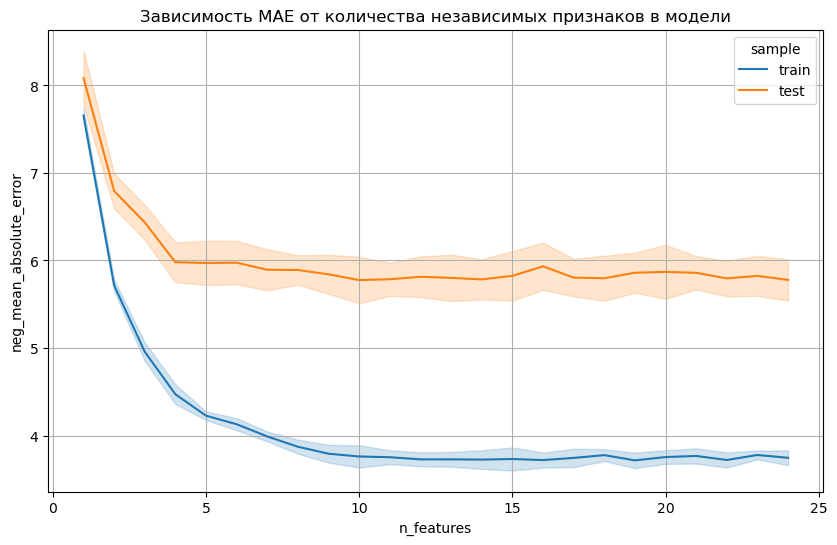

In [115]:
cv_results, best_params = catboost_rfecv(features_train,target_train,folds,'neg_mean_absolute_error','MAE')

In [116]:
best_params 


{'depth': 6, 'iterations': 100, 'learning_rate': 0.2}

In [117]:
n_features_optimal = 15
model = cat.CatBoostRegressor(**best_params)
rfe = RFE(model, n_features_to_select=n_features_optimal)   
rfe = rfe.fit(features_train, target_train)
final_model = rfe.estimator_
dump(final_model, 'catboost.joblib')

0:	learn: 10.6453129	total: 23.7ms	remaining: 2.34s
1:	learn: 10.1881239	total: 28.4ms	remaining: 1.39s
2:	learn: 9.7838352	total: 31.8ms	remaining: 1.03s
3:	learn: 9.4157268	total: 36.2ms	remaining: 870ms
4:	learn: 9.0998052	total: 40.1ms	remaining: 762ms
5:	learn: 8.8857931	total: 44.1ms	remaining: 690ms
6:	learn: 8.6775936	total: 47.4ms	remaining: 629ms
7:	learn: 8.5628310	total: 54.8ms	remaining: 630ms
8:	learn: 8.3882926	total: 58.2ms	remaining: 588ms
9:	learn: 8.2496225	total: 61.7ms	remaining: 555ms
10:	learn: 8.1662357	total: 64.9ms	remaining: 525ms
11:	learn: 8.0633735	total: 68.1ms	remaining: 499ms
12:	learn: 7.9722578	total: 71.8ms	remaining: 481ms
13:	learn: 7.8983648	total: 75.3ms	remaining: 462ms
14:	learn: 7.7915581	total: 79ms	remaining: 448ms
15:	learn: 7.7228209	total: 82.9ms	remaining: 435ms
16:	learn: 7.6658154	total: 87.9ms	remaining: 429ms
17:	learn: 7.5887032	total: 91.9ms	remaining: 419ms
18:	learn: 7.5600875	total: 96.6ms	remaining: 412ms
19:	learn: 7.4851320	t

['catboost.joblib']

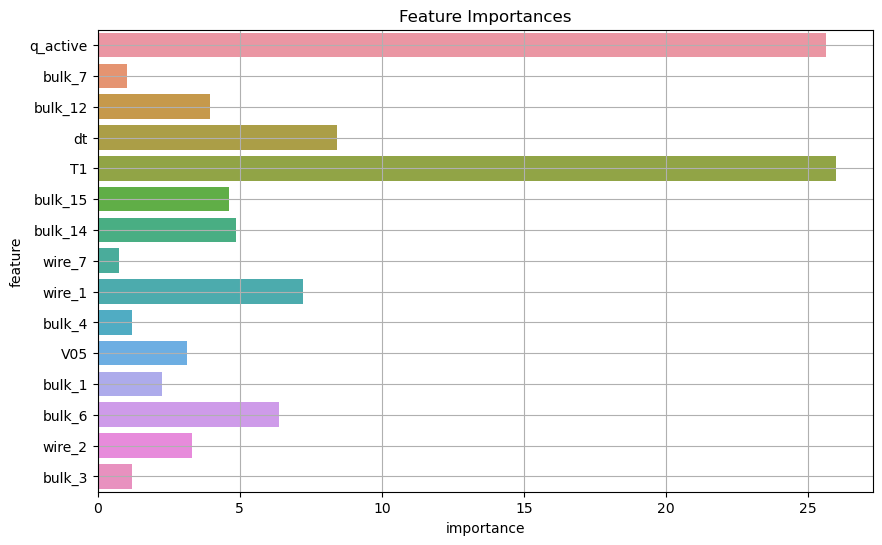

In [118]:
feature_names_03 = list(rfe.get_feature_names_out())
feature_importances = pd.DataFrame(columns=['feature','importance'])
feature_importances['feature'] = feature_names_03
feature_importances['importance'] = final_model.feature_importances_
fig, axs = plt.subplots(figsize=(10,6))
sns.barplot(data=feature_importances,x='importance',y='feature',orient='h',ax=axs)
axs.grid(True)
axs.set(title=f'Feature Importances')
plt.show()

## 6.5. <a id='toc6_5_'></a>[<font color='#42AAFF'>Вывод</font>](#toc0_)

1. Обучили модели линейной регрессии, XGBoost, LightGBM, CatBoost. Для бустингов получили MAE не выше $6.0\degree$, для регрессии ~$6.3\degree$
2. При обучении всех моделей применяли рекурсивное ранжирование признаков (RFE) 5 блочном кроссвалидационном разбиении. В случае бустинговых моделей предварительно оптимизировали гиперпараметры на тех же блоках кроссвалидационного разбиения.
3. Модели линейной регрессии, LightGBM, Catboost выделили наиболее важными одни и те же признаки:
    - температура сплава при первом измерении;
    - активная энергия подогрева сплава;
    - длительность процесса легирования.
4. Список наиболее важных признаков XGBoost несколько отличается:
    - температура сплава при первом измерении;
    - активная энергия подогрева сплава;
    - масса wire_4;
    - масса bulk_7.

# 7. <a id='toc7_'></a>[<font color='#42AAFF'>Проверка моделей на тестовой выборке</font>](#toc0_)

## 7.1. <a id='toc7_1_'></a>[<font color='#42AAFF'>Линейная регрессия</font>](#toc0_)

Рассчитаем MAE оценки финальной температуры на тестовой выборке:

In [119]:
%%time
model = load('linreg_model.joblib')
pred_T = model.predict(features_test[final_coeff['feature']].values)
print(f'MAE оценки финальной температуры T: {mean_absolute_error(target_test, pred_T):0.1f}'+u'\N{DEGREE SIGN}')

MAE оценки финальной температуры T: 6.2°
Wall time: 3.48 ms


## 7.2. <a id='toc7_2_'></a>[<font color='#42AAFF'>XGBoost</font>](#toc0_)

In [120]:
%%time
model = load('xgboost.joblib') 
pred_test = model.predict(features_test[feature_names_01])  
print(f'MAE оценки финальной температуры T: {mean_absolute_error(target_test, pred_test):0.1f}'+u'\N{DEGREE SIGN}')

MAE оценки финальной температуры T: 5.9°
Wall time: 22.7 ms


## 7.3. <a id='toc7_3_'></a>[<font color='#42AAFF'>LightGBM</font>](#toc0_)

In [121]:
%%time
model = load('lgbm.joblib') 
pred_test = model.predict(features_test[feature_names_02])  
print(f'MAE оценки финальной температуры T: {mean_absolute_error(target_test, pred_test):0.1f}'+u'\N{DEGREE SIGN}')

MAE оценки финальной температуры T: 6.0°
Wall time: 13.2 ms


## 7.4. <a id='toc7_4_'></a>[<font color='#42AAFF'>CatBoost</font>](#toc0_)

In [122]:
%%time
model = load('catboost.joblib') 
pred_test = model.predict(features_test[feature_names_03])  
print(f'MAE оценки финальной температуры T: {mean_absolute_error(target_test, pred_test):0.1f}'+u'\N{DEGREE SIGN}')

MAE оценки финальной температуры T: 5.9°
Wall time: 7 ms


## 7.5. <a id='toc7_5_'></a>[<font color='#42AAFF'>Вывод</font>](#toc0_)

1. Наилучшие результаты показали бустинговые модели, для которых MAE не выше $6.0\degree$.
2. К наиболее сильно влияющим факторам относятся:
    - температура сплава при первом измерении;
    - активная энергия подогрева сплава;
    - длительность процесса легирования.

# 8. <a id='toc8_'></a>[<font color='#42AAFF'>Общий вывод</font>](#toc0_)

<b>I. Первичный обзор данных</b>

1. Обнаружили несоответствие названий столбцов таблиц требованиям PEP8.
2. Выявили несоответствие типов.
3. Обнаружили пропуски, в том числе в целевом параметре.
4. Не обнаружили дубликатов.

<b>II. Анализ физического процесса</b>

Провели анализ рассматриваемого физического процесса и на основании полученного понимания составили список потенциально влияющих факторов на финальную температуру расплава:

1. $\mathbf{T_1}$ - температура 1го измерения
2. $\mathbf{\sum\limits _{i} ^{}P_i \Delta t_i}$ - суммарная энергия нагрева электродами в интервале температур между $T_1$ и $T$
3. $\mathbf{m_b}$ - массы сыпучих легирующих компонент
4. $\mathbf{m_w}$ - массы проволочных легирующих компонент
5. $\mathbf{\Delta t}$ - интервал времени между первым и последним измерениями температур
6. $\mathbf{\bar{T}\Delta t}$ - произведение средневзвешенной температуры расплава и интервала времени между крайними измерениями
7. $\mathbf{\bar{T}^4\Delta t}$ - произведение средневзвешенной температуры расплава в 4 степени и интервала времени между крайними измерениями
8. $\mathbf{V}$ - объем газа
9. $\mathbf{V^{0.5}}$ - корень кв. из объема газа
10. $\mathbf{V\bar{T}}$ - произведение объема газа на средневзвешенную температуру
11. $\mathbf{V^{0.5}\bar{T}}$ - произведение корня кв. из объема газа на средневзвешенную температуру

<b>III. Предобработка и исследовательский анализ данных</b>

1. Привели название столбцов в соответствие PEP8.
2. Скорректировали типы данных.
3. Подготовили функцию для удобного просмотра карты техпроцесса.
4. Исследовали технологические карты легирования различных партий материала и выявили ряд несоответствий:
    - Часть данных не содержит целевого параметра - последнего измерения температуры перед разливкой заготовок. Более того во многих таких случаях отсутствуют и несколько предыдущих измерений.
    - Обнаружено большое количество нарушений в части времени добавления легирующих компонентов. Так по данным легирующие компоненты могут добавляться в процессе нагрева, далеко не перед каждым нагревом происходит добавление легирующих компонент. После уточнения у тимлида выяснилось, что времена в таблицах по легирующим компонентам могут быть ошибочными и на них не стоит ориентироваться.
    - Встречаются партии, в которых первому измерению температуры предшествует один или несколько циклов нагрева, что противоречию описанию тех процесса. Вероятно время первого измерения также может быть определено ошибочно.
5. Исключили из рассмотрения партии с неполными данными и данные, не имеющими физического смысла:
    - без финальной температуры;
    - с исходной температурой ниже температуры плавления (<1400 градусов);
    - с 1м измерением температуры;
    - данные по реактивной мощности, так как с физической точки зрения они не влияют на нагрев стали, кроме того реактивная и активная мощность коррелируют с коэффициентом корреляции 0.97;
    - удалили пустые столбцы c массами bulk_8 и wire_5

<b>IV. Подготовка признаков для обучения модели</b>

1. Сформировали таблицу признаков на основе физических представлений о модели.
2. Разбили данные на целевой и остальные признаки, а также на тренировочную и тестовую выборки в соотношении 80/20.
3. Стандартизировали нецелевые признаки. Модель обучена на тренировочной части и применена ко всем данным.
4. Исключили мультиколлинеарные признаки с помощью Variance Inflation Factor.

<b>V. Обучение моделей</b>

1. Обучили линейную регрессию, MAE ~ $6.3\degree$    
2. Бустинги позволили получить MAE не выше $6.0\degree$.
3. При обучении всех моделей применяли рекурсивное ранжирование признаков (RFE) 5 блочном кроссвалидационном разбиении. В случае бустинговых моделей предварительно оптимизировали гиперпараметры на тех же блоках кроссвалидационного разбиения.
4. Модели линейной регрессии и LightGBM выделили наиболее важными одни и те же признаки (при этом остальные признаки практически не влияют на метрику в случае линейной регресии и немного улучшают метрику в случае LGBM):
    - температура сплава при первом измерении;
    - активная энергия подогрева сплава;
    - длительность процесса легирования.
5. Список наиболее важных признаков XGBoost иной:
    - температура сплава при первом измерении;
    - активная энергия подогрева сплава;
    - масса wire_4;
    - масса bulk_7.

<b>VI. Проверка моделей на тестовой выборке</b>    
1. Наилучшие результаты показали бустинговые модели, для которых MAE не выше $6.0\degree$.
2. К наиболее сильно влияющим факторам относятся:
    - температура сплава при первом измерении;
    - активная энергия подогрева сплава;
    - длительность процесса легирования.

